**last update: 07/27/2024**  

This notebook is for Bayesian Gaussian process regression test.

Dataset: SOI(Pacific Southern Oscillation Index, for ENSO) 1875 -2024. Annual mean.

Design: Test different kernels with ENSO index and give evaluations, especially for complex kernels.

# Package

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, Matern, RationalQuadratic, DotProduct
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import gpflow
from gpflow.utilities import print_summary
from gpflow.kernels import RBF, Cosine, Product
from sklearn.linear_model import LinearRegression
import tensorflow as tf
from sklearn.gaussian_process.kernels import RBF, ExpSineSquared
import numpy as np
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.utils.validation import check_is_fitted, NotFittedError
from skopt import BayesSearchCV
from skopt.space import Real
import pywt
from tqdm import tqdm
from bayes_opt import BayesianOptimization

# Data

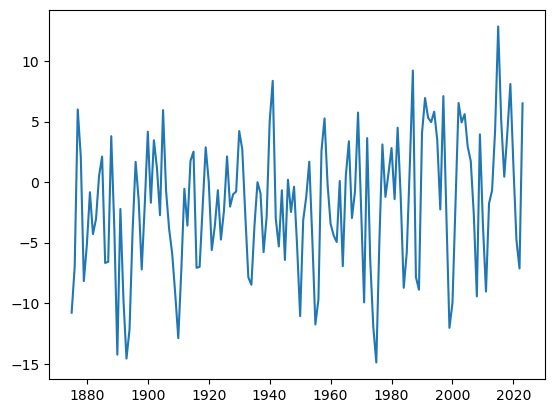

In [2]:
enso = pd.read_excel('../data/ENSO/ENSO_index_yearly.xlsx')
enso=enso.set_index('Year')
plt.plot(enso)

In [3]:
enso_data = pd.read_excel('../data/ENSO/ENSO_index_yearly.xlsx')
X = enso_data.iloc[:, 0].values.reshape(-1, 1)
Y = enso_data.iloc[:, 1].values.reshape(-1, 1)
y = enso_data['Value'].values

# Kernel

## Spectral Mixture Like Kernel: RBF*COS

### 10 samples with 95%CI

╒═══════════════════════════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤═════════╤═════════╤═══════════╕
│ name                                          │ class     │ transform        │ prior   │ trainable   │ shape   │ dtype   │     value │
╞═══════════════════════════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪═════════╪═════════╪═══════════╡
│ GPR.kernel.kernels[0].kernels[0].variance     │ Parameter │ Softplus         │         │ True        │ ()      │ float64 │  2.07419  │
├───────────────────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼─────────┼─────────┼───────────┤
│ GPR.kernel.kernels[0].kernels[0].lengthscales │ Parameter │ Softplus         │         │ True        │ ()      │ float64 │  2.57549  │
├───────────────────────────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼─────────┼─────────┼───────────┤
│ GPR.kernel.kernels[0].kernels[1].varian

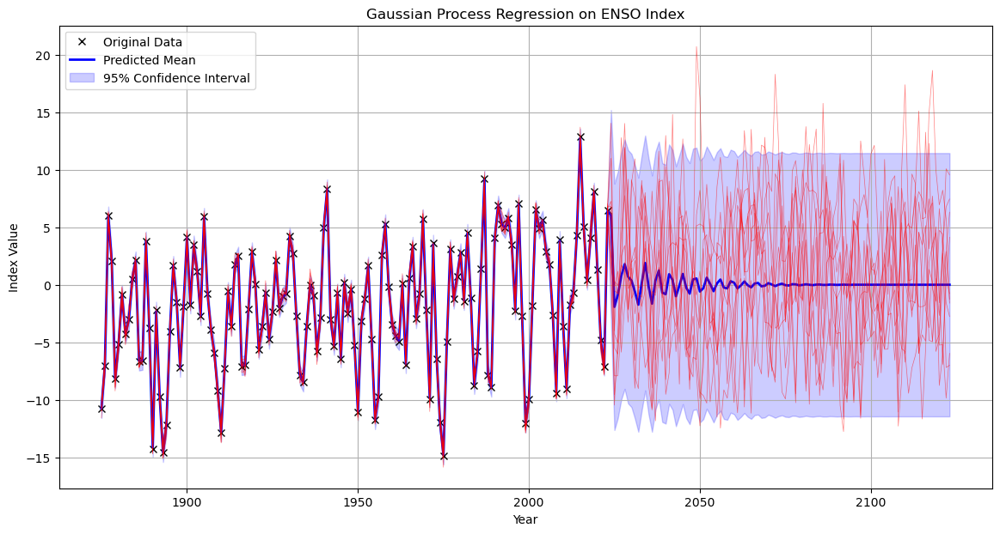

In [4]:
def create_spectral_mixture_like_kernel(Q, D):
    """Create a kernel similar to Spectral Mixture using RBF and Cosine kernels."""
    kernel = None
    for _ in range(Q):
        rbf = RBF(lengthscales=np.random.rand() * 2)
        cosine = Cosine(lengthscales=np.random.rand() * 2)
        product_kernel = Product([rbf, cosine])
        if kernel is None:
            kernel = product_kernel
        else:
            kernel += product_kernel
    return kernel


kernel = create_spectral_mixture_like_kernel(Q=4, D=1)
model = gpflow.models.GPR(data=(X, Y), kernel=kernel, mean_function=None)
optimizer = gpflow.optimizers.Scipy()
optimizer.minimize(model.training_loss, model.trainable_variables)
print_summary(model)

# marginal likelihood
marginal_likelihood = model.log_marginal_likelihood().numpy()
print(f"Marginal Likelihood: {marginal_likelihood}")




# MSE
mean, var = model.predict_f(X)
mse = mean_squared_error(Y, mean)
print(f"Mean Squared Error (MSE): {mse}")

# prediction for future 100yrs
future_years = np.arange(X[-1, 0] + 1, X[-1, 0] + 101).reshape(-1, 1)
all_years = np.vstack([X, future_years])
mean, var = model.predict_f(all_years)

#plot
plt.figure(figsize=(14, 7))
plt.plot(X, Y, 'kx', label='Original Data')
plt.plot(all_years, mean, 'b', lw=2, label='Predicted Mean')

#samples
samples = model.predict_f_samples(all_years, 10) 
for i in range(samples.shape[0]):
    plt.plot(all_years, samples[i, :, 0], 'r', lw=0.5, alpha=0.5)
plt.fill_between(all_years[:, 0], 
                 mean[:, 0] - 1.96 * np.sqrt(var[:, 0]), 
                 mean[:, 0] + 1.96 * np.sqrt(var[:, 0]), 
                 color='blue', alpha=0.2, label='95% Confidence Interval')

plt.xlabel('Year')
plt.ylabel('Index Value')
plt.title('Gaussian Process Regression on ENSO Index')
plt.legend()
plt.grid(True)
plt.show()


### 5samples with 1 std

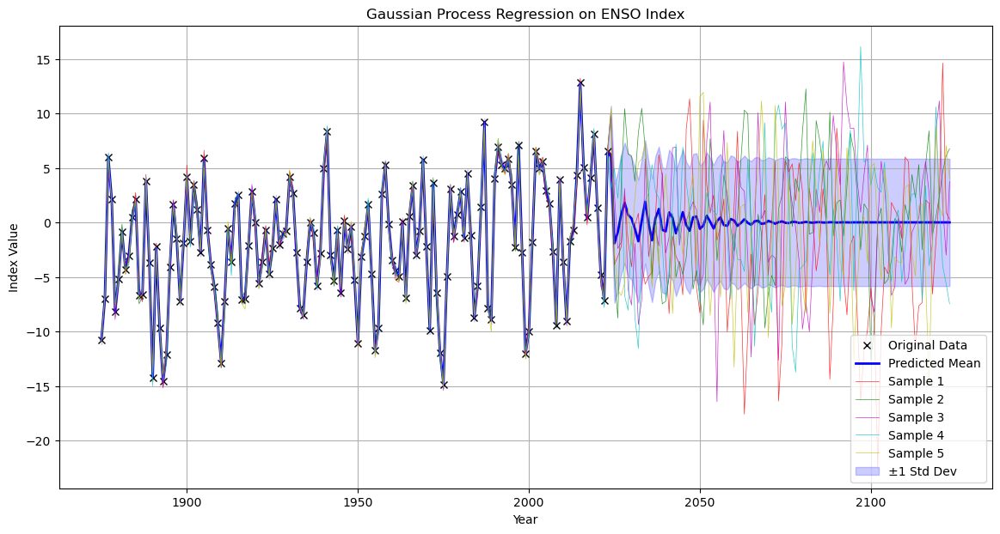

In [5]:
future_years = np.arange(X[-1, 0] + 1, X[-1, 0] + 101).reshape(-1, 1)
all_years = np.vstack([X, future_years])
mean, var = model.predict_f(all_years)

plt.figure(figsize=(14, 7))
plt.plot(X, Y, 'kx', label='Original Data')
plt.plot(all_years, mean, 'b', lw=2, label='Predicted Mean')

samples = model.predict_f_samples(all_years, 5)  
colors = ['r', 'g', 'm', 'c', 'y'] 
for i in range(samples.shape[0]):
    plt.plot(all_years, samples[i, :, 0], colors[i], lw=0.5, alpha=0.8, label=f'Sample {i+1}')

plt.fill_between(all_years[:, 0], 
                 mean[:, 0] - np.sqrt(var[:, 0]), 
                 mean[:, 0] + np.sqrt(var[:, 0]), 
                 color='blue', alpha=0.2, label='±1 Std Dev')

plt.xlabel('Year')
plt.ylabel('Index Value')
plt.title(f'Gaussian Process Regression on ENSO Index')
plt.legend()
plt.grid(True)
plt.show()


## adaptive period kernel

模型的表达式：
Polynomial Features: ['1' 'x0' 'x0^2']
Linear Regression Coefficients: [ 0.00000000e+00 -8.83443838e-01  2.34973145e-04]
Linear Regression Intercept: 826.9977147852712


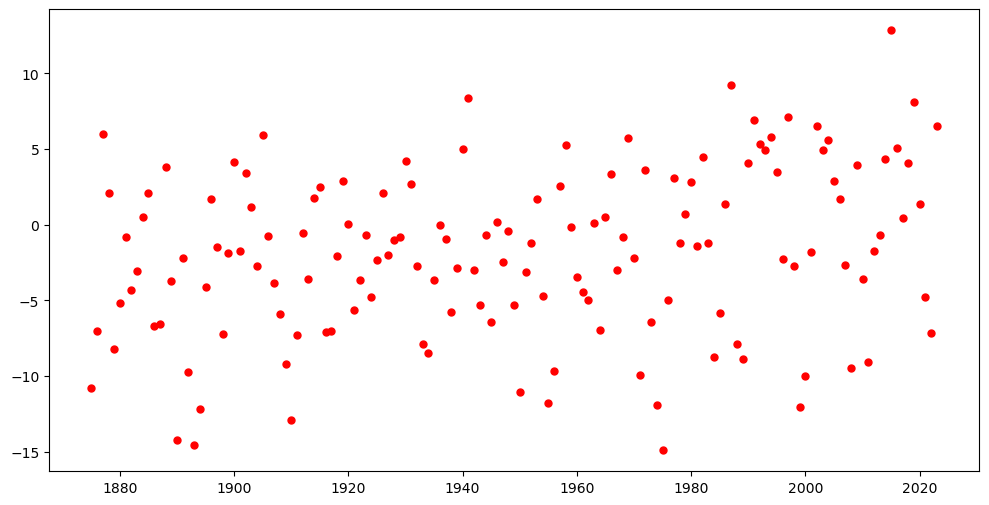

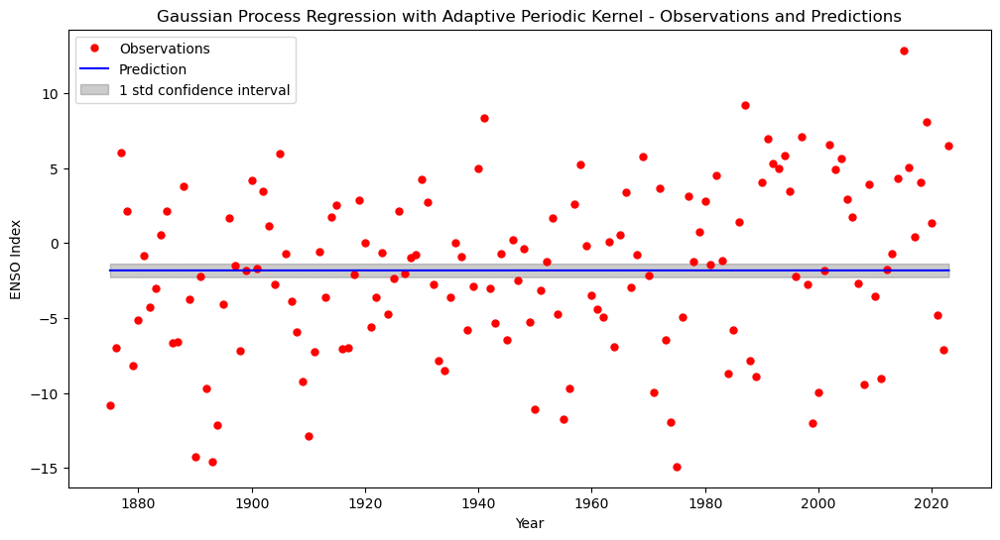

Log Marginal Likelihood: -213.92823169026735
Mean Squared Error: 30.089014243549247


In [191]:
from sklearn.gaussian_process.kernels import Kernel, Hyperparameter

class AdaptivePeriodicKernel(Kernel):
    def __init__(self, model, poly_features, length_scale=1.0, length_scale_bounds=(1e-3, 1e3)):
        self.model = model
        self.poly_features = poly_features
        self.length_scale = length_scale
        self.length_scale_bounds = length_scale_bounds

    def __call__(self, X, Y=None, eval_gradient=False):
        X = np.atleast_2d(X)
        if Y is None:
            Y = X
        Y = np.atleast_2d(Y)
        
        print(f"X shape: {X.shape}")
        print(f"Y shape: {Y.shape}")
        
        # distance matrix
        dists = np.abs(X[:, np.newaxis] - Y[np.newaxis, :]).squeeze()
        print(f"dists shape: {dists.shape}")

        # x,y,p(t)
        X_poly = self.poly_features.transform(X)
        Y_poly = self.poly_features.transform(Y)
        
        print(f"X_poly shape: {X_poly.shape}")
        
        p_t_X = self.model.predict(X_poly)
        print(f"p_t_X: {p_t_X}")
        
        print(f"Y_poly shape: {Y_poly.shape}")
        
        p_t_Y = self.model.predict(Y_poly)
        print(f"p_t_Y: {p_t_Y}")
        
        # periodic matrix
        p_t_matrix_X = np.repeat(p_t_X[:, np.newaxis], Y.shape[0], axis=1)
        p_t_matrix_Y = np.repeat(p_t_Y[np.newaxis, :], X.shape[0], axis=0)
        periodicity_matrix = (p_t_matrix_X + p_t_matrix_Y) / 2.0 + 1e-6  # avoid 0 divided
        
        print(f"periodicity_matrix shape: {periodicity_matrix.shape}")
        print(f"periodicity_matrix: {periodicity_matrix}")

        K = np.exp(-2 * (np.sin(np.pi * dists / periodicity_matrix) ** 2) / self.length_scale ** 2)
        
        print(f"K shape: {K.shape}")
        print(f"K: {K}")
        
        if eval_gradient:
            length_scale_gradient = K * 4 * (np.sin(np.pi * dists / periodicity_matrix) ** 2) / (self.length_scale ** 3)
            return K, np.dstack((length_scale_gradient,))
        return K

    @property
    def hyperparameter_length_scale(self):
        return Hyperparameter("length_scale", "numeric", self.length_scale_bounds)

    def diag(self, X):
        return np.ones(X.shape[0])

    def is_stationary(self):
        return False


X = enso_data.iloc[:, 0].values.reshape(-1, 1)
Y = enso_data.iloc[:, 1].values.reshape(-1, 1)
y = enso_data['Value'].values

poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

model = LinearRegression()
model.fit(X_poly, y)

try:
    check_is_fitted(poly_features, attributes=["n_features_in_"])
except NotFittedError as e:
    raise e

try:
    check_is_fitted(model, attributes=["coef_"])
except NotFittedError as e:
    raise e

kernel = AdaptivePeriodicKernel(model=model, poly_features=poly_features, length_scale=1.0)

gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, normalize_y=True, alpha=1)

try:
    gpr.fit(X, y)
except Exception as e:
    print(f"Error during fitting: {e}")

try:
    y_pred, sigma = gpr.predict(X, return_std=True)
except Exception as e:
    print(f"Error during prediction: {e}")

try:
    log_marginal_likelihood = gpr.log_marginal_likelihood()
    mse = mean_squared_error(y, y_pred)
except Exception as e:
    print(f"Error during calculation of log marginal likelihood or MSE: {e}")

future_years = np.arange(X.max() + 1, X.max() + 101).reshape(-1, 1)
X_combined = np.vstack((X, future_years))


plt.figure(figsize=(12, 6))
plt.plot(X, y, 'r.', markersize=10, label='Observations')

print(f"Polynomial Features: {poly_features.get_feature_names_out()}")
print(f"Linear Regression Coefficients: {model.coef_}")
print(f"Linear Regression Intercept: {model.intercept_}")

plt.figure(figsize=(12, 6))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X, y_pred, 'b-', label='Prediction')
plt.fill_between(X.ravel(), y_pred - sigma, y_pred + sigma, alpha=0.2, color='k', label='1 std confidence interval')
plt.xlabel('Year')
plt.ylabel('ENSO Index')
plt.legend()
plt.title('Gaussian Process Regression with Adaptive Periodic Kernel - Observations and Predictions')
plt.show()

try:
    print("Log Marginal Likelihood:", log_marginal_likelihood)
    print("Mean Squared Error:", mse)
except Exception as e:
    print(f"Error during final output: {e}")

## spectral mixture kernel

In [9]:
X = enso_data.iloc[:, 0].values.reshape(-1, 1).astype(float)
Y = enso_data.iloc[:, 1].values.reshape(-1, 1).astype(float)

Using VaryingPeriod Kernel
╒═════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤═════════╤═════════╤══════════════╕
│ name                    │ class     │ transform        │ prior   │ trainable   │ shape   │ dtype   │        value │
╞═════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪═════════╪═════════╪══════════════╡
│ GPR.kernel.variance     │ Parameter │ Softplus         │         │ True        │ ()      │ float64 │  1.07962     │
├─────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼─────────┼─────────┼──────────────┤
│ GPR.kernel.lengthscales │ Parameter │ Softplus         │         │ True        │ ()      │ float64 │  0.992479    │
├─────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼─────────┼─────────┼──────────────┤
│ GPR.kernel.period       │ Parameter │ Softplus         │         │ True        │ ()      │ float64 │  1.47611e-09 │
├─────────────────────────┼──

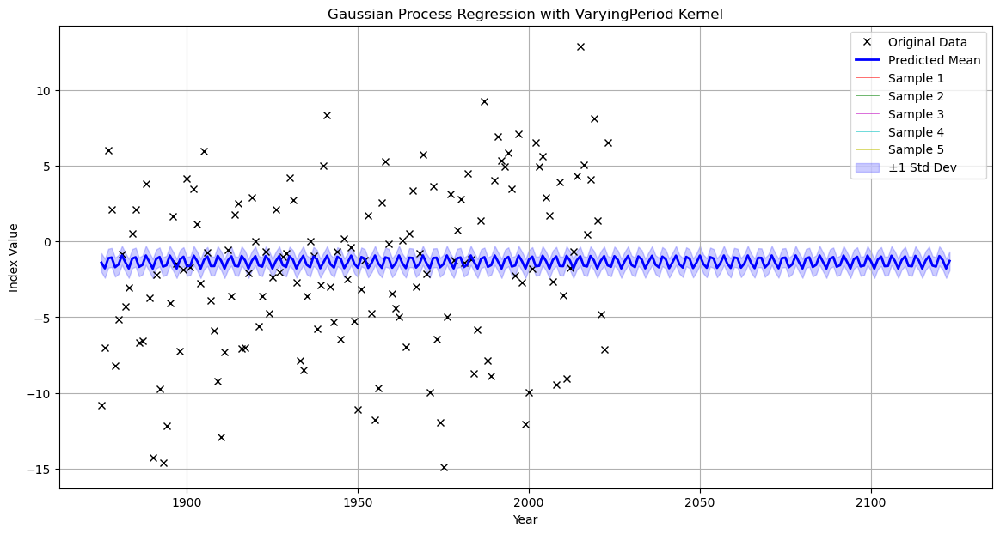

Using AdaptivePeriod Kernel
╒═════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤═════════╤═════════╤═════════╕
│ name                    │ class     │ transform        │ prior   │ trainable   │ shape   │ dtype   │   value │
╞═════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪═════════╪═════════╪═════════╡
│ GPR.kernel.variance     │ Parameter │ Softplus         │         │ True        │ ()      │ float64 │       1 │
├─────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼─────────┼─────────┼─────────┤
│ GPR.kernel.lengthscales │ Parameter │ Softplus         │         │ True        │ ()      │ float64 │       1 │
├─────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼─────────┼─────────┼─────────┤
│ GPR.kernel.base_period  │ Parameter │ Softplus         │         │ True        │ ()      │ float64 │       1 │
├─────────────────────────┼───────────┼──────────────────┼─────────┼

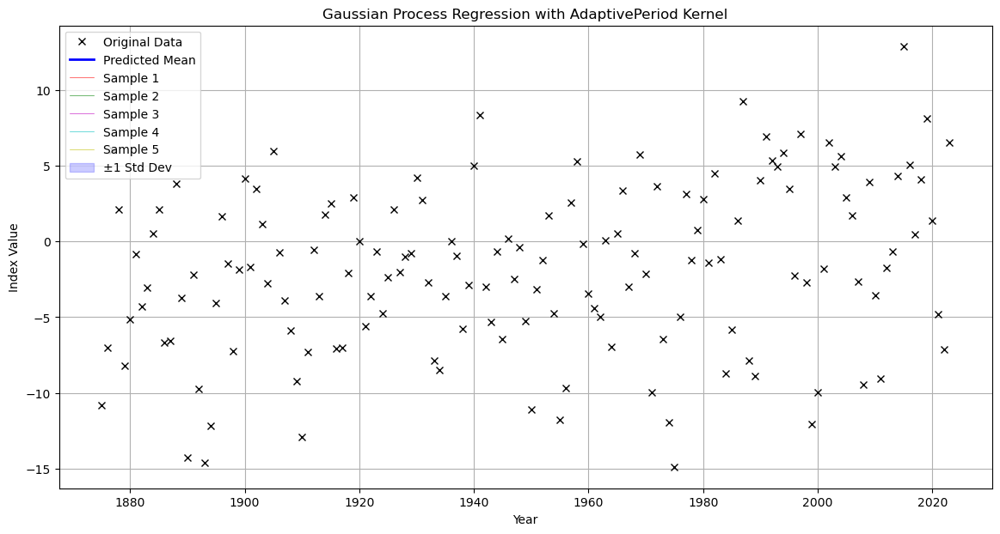

In [10]:
class VaryingPeriodKernel(gpflow.kernels.Kernel):
    def __init__(self, variance=1.0, lengthscales=1.0, period=1.0):
        super().__init__()
        self.variance = gpflow.Parameter(variance, transform=gpflow.utilities.positive(), dtype=tf.float64)
        self.lengthscales = gpflow.Parameter(lengthscales, transform=gpflow.utilities.positive(), dtype=tf.float64)
        self.period = gpflow.Parameter(period, transform=gpflow.utilities.positive(), dtype=tf.float64)

    def K(self, X, X2=None):
        if X2 is None:
            X2 = X
        rbf_part = self.variance * tf.exp(-tf.square(tf.sin(np.pi * tf.abs(X[:, None] - X2[None, :]) / self.period)) / (2 * tf.square(self.lengthscales)))
        rbf_part = tf.squeeze(rbf_part, axis=-1)  # 去除多余的维度
        return rbf_part

    def K_diag(self, X):
        return tf.fill(tf.shape(X)[:-1], tf.squeeze(self.variance))

class AdaptivePeriodKernel(gpflow.kernels.Kernel):
    def __init__(self, variance=1.0, lengthscales=1.0, base_period=1.0, period_scale=1.0):
        super().__init__()
        self.variance = gpflow.Parameter(variance, transform=gpflow.utilities.positive(), dtype=tf.float64)
        self.lengthscales = gpflow.Parameter(lengthscales, transform=gpflow.utilities.positive(), dtype=tf.float64)
        self.base_period = gpflow.Parameter(base_period, transform=gpflow.utilities.positive(), dtype=tf.float64)
        self.period_scale = gpflow.Parameter(period_scale, transform=gpflow.utilities.positive(), dtype=tf.float64)

    def K(self, X, X2=None):
        if X2 is None:
            X2 = X
        period = self.base_period + self.period_scale * tf.abs(X[:, None] - X2[None, :])
        rbf_part = self.variance * tf.exp(-tf.square(tf.sin(np.pi * tf.abs(X[:, None] - X2[None, :]) / period)) / (2 * tf.square(self.lengthscales)))
        rbf_part = tf.squeeze(rbf_part, axis=-1)  # 去除多余的维度
        return rbf_part

    def K_diag(self, X):
        return tf.fill(tf.shape(X)[:-1], tf.squeeze(self.variance))

def plot_gp_results(model, X, Y, future_years, title="Gaussian Process Regression"):

    all_years = np.vstack([X, future_years])
    mean, var = model.predict_f(all_years)

    # 绘制结果
    plt.figure(figsize=(14, 7))

    # 原始数据
    plt.plot(X, Y, 'kx', label='Original Data')

    # 预测均值
    plt.plot(all_years, mean, 'b', lw=2, label='Predicted Mean')

    # 预测的样本
    samples = model.predict_f_samples(all_years, 5)  # 5个样本
    colors = ['r', 'g', 'm', 'c', 'y']  # 5种不同颜色
    for i in range(samples.shape[0]):
        plt.plot(all_years, samples[i, :, 0], colors[i], lw=0.5, alpha=0.8, label=f'Sample {i+1}')

    # 设置图例和标签
    plt.fill_between(all_years[:, 0], 
                     mean[:, 0] - np.sqrt(var[:, 0]), 
                     mean[:, 0] + np.sqrt(var[:, 0]), 
                     color='blue', alpha=0.2, label='±1 Std Dev')

    plt.xlabel('Year')
    plt.ylabel('Index Value')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

# 预测未来100年的数据
future_years = np.arange(X[-1, 0] + 1, X[-1, 0] + 101).reshape(-1, 1)
all_years = np.vstack([X, future_years])

# # 进行预测
# mean, var = model.predict_f(all_years)
# if np.isnan(mean).any() or np.isnan(var).any():
#     raise ValueError("Prediction contains NaN values.")
# # 计算边际似然
# marginal_likelihood = model.log_marginal_likelihood().numpy()
# print(f"Marginal Likelihood: {marginal_likelihood}")

# # 计算均方误差
# mse = mean_squared_error(Y, model.predict_f(X)[0])
# print(f"MSE: {mse}")
# 使用自定义核函数进行分析并绘图
kernels = {
    'VaryingPeriod': VaryingPeriodKernel(),
    'AdaptivePeriod': AdaptivePeriodKernel()
}

for name, kernel in kernels.items():
    print(f"Using {name} Kernel")

    # 高斯过程回归模型
    model = gpflow.models.GPR(data=(X, Y), kernel=kernel, mean_function=None)

    # 优化模型
    optimizer = gpflow.optimizers.Scipy()
    optimizer.minimize(model.training_loss, model.trainable_variables)

    # 打印模型摘要
    print_summary(model)

    # 绘制结果
    plot_gp_results(model, X, Y, future_years, title=f"Gaussian Process Regression with {name} Kernel")


## locally period kernel

d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


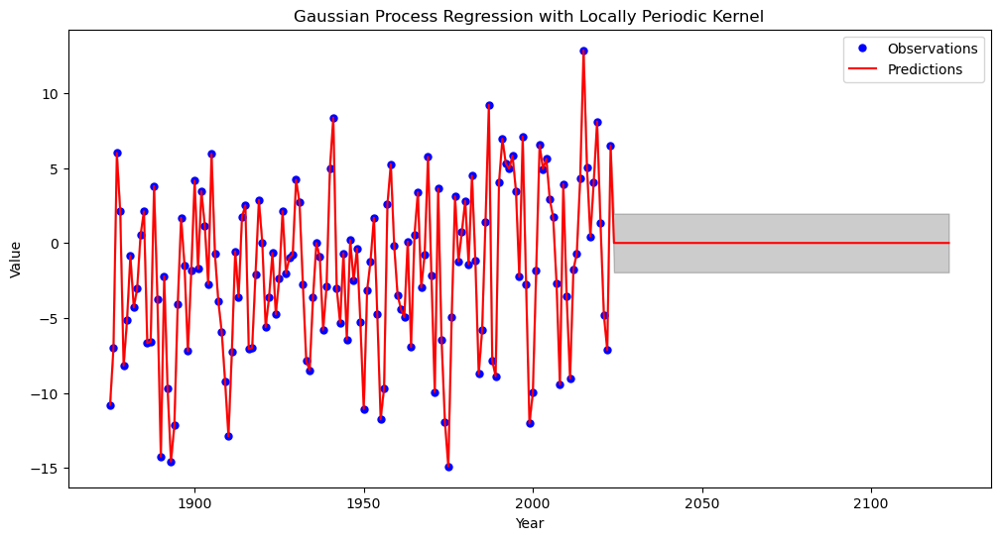

(-2628.2313912058153, 60.18004530725619)

In [11]:
# Define the Locally Periodic kernel
# Locally Periodic Kernel: k(x, x') = exp(-|x - x'|^2 / (2 * l^2)) * exp(-2 * sin^2(pi * |x - x'| / p) / l_p^2)
kernel = ExpSineSquared(length_scale=1.0, periodicity=1.0) * RBF(length_scale=1.0)

# Fit the GPR model
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
gpr.fit(X, y)

# Predict future values for the next 100 years
future_years = np.arange(X[-1, 0] + 1, X[-1, 0] + 101).reshape(-1, 1)
X_all = np.vstack((X, future_years))
y_pred, y_std = gpr.predict(X_all, return_std=True)

# Calculate the log marginal likelihood and mean squared error
lml = gpr.log_marginal_likelihood()
mse = np.mean((gpr.predict(X) - y) ** 2)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(X, y, 'b.', markersize=10, label='Observations')
plt.plot(X_all, y_pred, 'r-', label='Predictions')
plt.fill_between(X_all.ravel(), y_pred - 1.96 * y_std, y_pred + 1.96 * y_std, alpha=0.2, color='k')
plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Gaussian Process Regression with Locally Periodic Kernel')
plt.legend()
plt.show()

lml, mse


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kerne

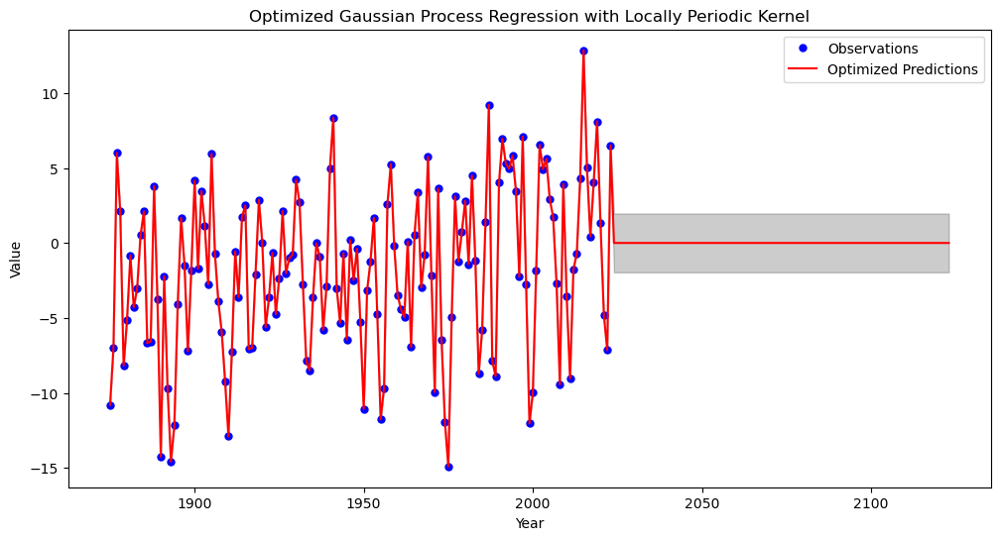

In [12]:
import random

# Define the parameter ranges
length_scales = np.logspace(-2, 2, 50)
periodicities = np.logspace(-2, 2, 50)

# Number of random samples to try
n_samples = 20

# Initialize variables to store the best parameters and the best log marginal likelihood
best_lml = -np.inf
best_params = None

# Perform random search
for _ in range(n_samples):
    length_scale = random.choice(length_scales)
    periodicity = random.choice(periodicities)
    kernel = ExpSineSquared(length_scale=length_scale, periodicity=periodicity) * RBF(length_scale=length_scale)
    gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=5)  # Reduce the number of restarts
    gpr.fit(X, y)
    lml = gpr.log_marginal_likelihood()
    if lml > best_lml:
        best_lml = lml
        best_params = {"length_scale": length_scale, "periodicity": periodicity}

# Extract optimized parameters
optimized_length_scale = best_params["length_scale"]
optimized_periodicity = best_params["periodicity"]

# Fit the GPR model with optimized parameters
optimized_kernel = ExpSineSquared(length_scale=optimized_length_scale, periodicity=optimized_periodicity) * RBF(length_scale=optimized_length_scale)
optimized_gpr = GaussianProcessRegressor(kernel=optimized_kernel, n_restarts_optimizer=5)  # Reduce the number of restarts
optimized_gpr.fit(X, y)

# Predict future values for the next 100 years using the optimized model
y_pred_optimized, y_std_optimized = optimized_gpr.predict(X_all, return_std=True)

# Calculate the log marginal likelihood and mean squared error for the optimized model
optimized_lml = optimized_gpr.log_marginal_likelihood()
optimized_mse = np.mean((optimized_gpr.predict(X) - y) ** 2)

# Plot the results with optimized parameters
plt.figure(figsize=(12, 6))
plt.plot(X, y, 'b.', markersize=10, label='Observations')
plt.plot(X_all, y_pred_optimized, 'r-', label='Optimized Predictions')
plt.fill_between(X_all.ravel(), y_pred_optimized - 1.96 * y_std_optimized, y_pred_optimized + 1.96 * y_std_optimized, alpha=0.2, color='k')
plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Optimized Gaussian Process Regression with Locally Periodic Kernel')
plt.legend()
plt.show()



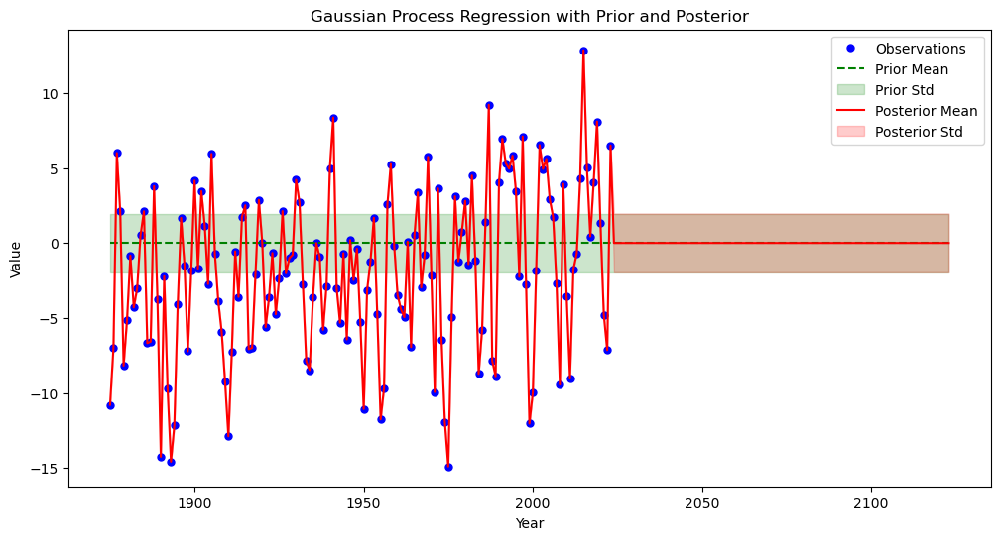

In [13]:
# Define the function to plot prior and posterior means and stds
def plot_prior_posterior(gpr, X, y, X_all, y_pred, y_std):
    # Prior: Using the initial kernel without fitting
    kernel = gpr.kernel
    gpr_prior = GaussianProcessRegressor(kernel=kernel)
    y_prior_mean, y_prior_std = gpr_prior.predict(X_all, return_std=True)
    
    plt.figure(figsize=(12, 6))
    
    # Plot observations
    plt.plot(X, y, 'b.', markersize=10, label='Observations')
    
    # Plot prior mean and std
    plt.plot(X_all, y_prior_mean, 'g--', label='Prior Mean')
    plt.fill_between(X_all.ravel(), y_prior_mean - 1.96 * y_prior_std, y_prior_mean + 1.96 * y_prior_std, alpha=0.2, color='g', label='Prior Std')
    
    # Plot posterior mean and std
    plt.plot(X_all, y_pred, 'r-', label='Posterior Mean')
    plt.fill_between(X_all.ravel(), y_pred - 1.96 * y_std, y_pred + 1.96 * y_std, alpha=0.2, color='r', label='Posterior Std')
    
    plt.xlabel('Year')
    plt.ylabel('Value')
    plt.title('Gaussian Process Regression with Prior and Posterior')
    plt.legend()
    plt.show()

# Plot the prior and posterior means and stds
plot_prior_posterior(optimized_gpr, X, y, X_all, y_pred_optimized, y_std_optimized)


## wavelet

In [77]:
from sklearn.gaussian_process.kernels import Kernel, Hyperparameter

class AdaptivePeriodicKernel(Kernel):
    def __init__(self, model, wavelet, level, length_scale=1.0, length_scale_bounds=(1e-3, 1e3)):
        self.model = model
        self.wavelet = wavelet
        self.level = level
        self.length_scale = length_scale
        self.length_scale_bounds = length_scale_bounds

    def __call__(self, X, Y=None, eval_gradient=False):
        X = np.atleast_2d(X)
        if Y is None:
            Y = X
        Y = np.atleast_2d(Y)

        dists = np.abs(X[:, np.newaxis] - Y[np.newaxis, :]).squeeze()

        X_wavelet = self._wavelet_transform(X)
        Y_wavelet = self._wavelet_transform(Y)
        
        print(f"X_wavelet shape: {X_wavelet.shape}")
        print(f"Y_wavelet shape: {Y_wavelet.shape}")

        p_t_X = self.model.predict(X_wavelet)
        p_t_Y = self.model.predict(Y_wavelet)

        p_t_matrix_X = np.repeat(p_t_X[:, np.newaxis], Y.shape[0], axis=1)
        p_t_matrix_Y = np.repeat(p_t_Y[np.newaxis, :], X.shape[0], axis=0)
        periodicity_matrix = (p_t_matrix_X + p_t_matrix_Y) / 2.0 + 1e-6 
        
        print(f"periodicity_matrix shape: {periodicity_matrix.shape}")

        K = np.exp(-2 * (np.sin(np.pi * dists / periodicity_matrix) ** 2) / self.length_scale ** 2)
        
        if eval_gradient:
            length_scale_gradient = K * 4 * (np.sin(np.pi * dists / periodicity_matrix) ** 2) / (self.length_scale ** 3)
            return K, np.dstack((length_scale_gradient,))
        return K

    def _wavelet_transform(self, X):
        coeffs = [pywt.wavedec(x.flatten(), self.wavelet, level=self.level) for x in X]
        max_length = max(len(np.hstack(c)) for c in coeffs)
        padded_coeffs = [np.pad(np.hstack(c), (0, max_length - len(np.hstack(c))), 'constant') for c in coeffs]
        transformed = np.vstack(padded_coeffs)
        print(f"Wavelet transform shape: {transformed.shape}")
        return transformed

    @property
    def hyperparameter_length_scale(self):
        return Hyperparameter("length_scale", "numeric", self.length_scale_bounds)

    def diag(self, X):
        return np.ones(X.shape[0])

    def is_stationary(self):
        return False


X = enso_data.iloc[:, 0].values.reshape(-1, 1)
y = enso_data['Value'].values

print(f"Original X shape: {X.shape}")
print(f"Original y shape: {y.shape}")


wavelet = 'db1'
level = 2
coeffs = [pywt.wavedec(x.flatten(), wavelet, level=level) for x in X]
max_length = max(len(np.hstack(c)) for c in coeffs)
padded_coeffs = [np.pad(np.hstack(c), (0, max_length - len(np.hstack(c))), 'constant') for c in coeffs]
X_wavelet = np.vstack(padded_coeffs)

print(f"Transformed X_wavelet shape: {X_wavelet.shape}")


model = LinearRegression()
model.fit(X_wavelet, y)

try:
    check_is_fitted(model)
    print("LinearRegression model is fitted.")
except NotFittedError as e:
    print("LinearRegression model is not fitted.")
    raise e

kernel = AdaptivePeriodicKernel(model=model, wavelet=wavelet, level=level, length_scale=1.0)
print("AdaptivePeriodicKernel instance is initialized.")

gpr = GaussianProcessRegressor(kernel=kernel, normalize_y=True, alpha=1e-6)
print("GaussianProcessRegressor instance is created.")


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_pred = model.predict(X_wavelet)
print(f"Initial prediction: {y_pred[:5]}") 


search_space = {
    'kernel__length_scale': Real(1e-3, 1e3, prior='log-uniform')
}

opt = BayesSearchCV(gpr, search_space, n_iter=50, cv=3, n_jobs=-1)
opt.fit(X_train, y_train)
print("Best parameters:", opt.best_params_)


gpr = opt.best_estimator_
print("GaussianProcessRegressor model is fitted with best parameters.")

try:
    y_pred, sigma = gpr.predict(X, return_std=True)
    print("Prediction and standard deviation calculated.")
except Exception as e:
    print(f"Error during prediction: {e}")

try:
    log_marginal_likelihood = gpr.log_marginal_likelihood()
    mse = mean_squared_error(y, y_pred)
    print(f"Log Marginal Likelihood: {log_marginal_likelihood}")
    print(f"Mean Squared Error: {mse}")
except Exception as e:
    print(f"Error during calculation of log marginal likelihood or MSE: {e}")

future_years = np.arange(X.max() + 1, X.max() + 101).reshape(-1, 1)
X_extended = np.vstack((X, future_years))

try:
    y_pred_extended, sigma_extended = gpr.predict(X_extended, return_std=True)
    print("Extended prediction calculated.")
except Exception as e:
    print(f"Error during extended prediction: {e}")

plt.figure(figsize=(12, 6))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
try:
    plt.plot(X_extended, y_pred_extended, 'b-', label='Prediction')
    plt.fill_between(X_extended.ravel(), y_pred_extended - sigma_extended, y_pred_extended + sigma_extended, alpha=0.2, color='k', label='1 std confidence interval')
except Exception as e:
    print(f"Error during plotting: {e}")
plt.xlabel('Year')
plt.ylabel('ENSO Index')
plt.legend()
plt.title('Gaussian Process Regression with Adaptive Periodic Kernel - Future Predictions')
plt.show()

try:
    print("Log Marginal Likelihood:", log_marginal_likelihood)
    print("Mean Squared Error:", mse)
except Exception as e:
    print(f"Error during final output: {e}")


Original X shape: (149, 1)
Original y shape: (149,)
Transformed X_wavelet shape: (149, 3)
LinearRegression model is fitted.
AdaptivePeriodicKernel instance is initialized.
GaussianProcessRegressor instance is created.
Initial prediction: [-4.23403221 -4.20155073 -4.16906925 -4.13658777 -4.10410629]


d:\APPsetup\anaconda\envs\rd\lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(


NotFittedError: This LinearRegression instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

## RBF + PERIOD + WN

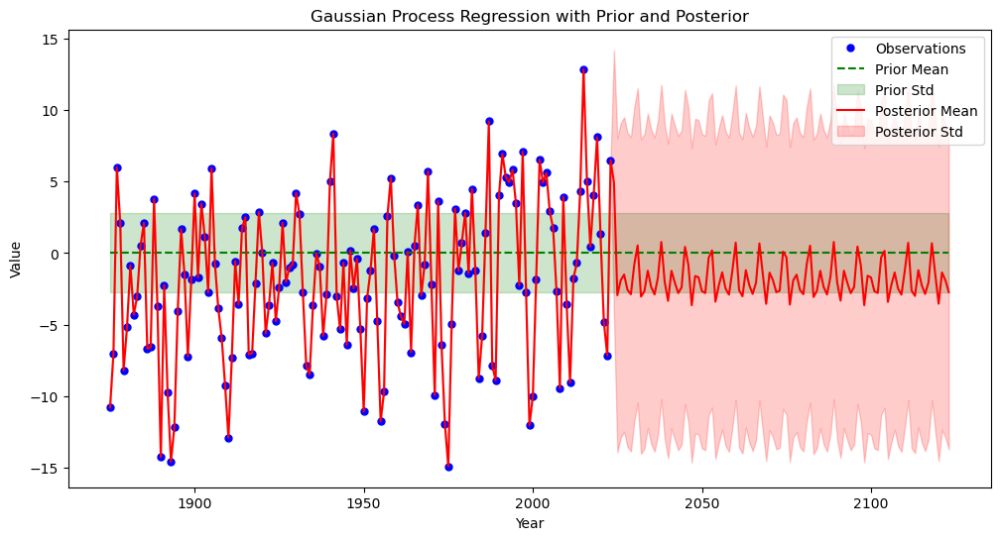

(ExpSineSquared(length_scale=1.31, periodicity=0.879) + RBF(length_scale=0.831) + WhiteKernel(noise_level=2.07e-07),
 -194.2153234929886)

In [14]:
from sklearn.gaussian_process.kernels import WhiteKernel

# Define the composite kernel: Periodic kernel + RBF kernel + White noise kernel
kernel = ExpSineSquared(length_scale=1.0, periodicity=1.0, length_scale_bounds=(1e-2, 1e1), periodicity_bounds=(1e-2, 1e1)) \
         + RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e1)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-10, 1e1))

# Fit the GPR model with the composite kernel
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, normalize_y=True)
gpr.fit(X, y)

# Check the optimized kernel parameters
optimized_kernel = gpr.kernel_

# Predict the posterior using the fitted model
y_pred, y_std = gpr.predict(X_all, return_std=True)

# Define the function to plot prior and posterior means and stds
def plot_prior_posterior(gpr, X, y, X_all, y_pred, y_std):
    # Prior: Using the initial kernel without fitting
    kernel = gpr.kernel_
    gpr_prior = GaussianProcessRegressor(kernel=kernel, normalize_y=True)
    y_prior_mean, y_prior_std = gpr_prior.predict(X_all, return_std=True)
    
    plt.figure(figsize=(12, 6))
    
    # Plot observations
    plt.plot(X, y, 'b.', markersize=10, label='Observations')
    
    # Plot prior mean and std
    plt.plot(X_all, y_prior_mean, 'g--', label='Prior Mean')
    plt.fill_between(X_all.ravel(), y_prior_mean - 1.96 * y_prior_std, y_prior_mean + 1.96 * y_prior_std, alpha=0.2, color='g', label='Prior Std')
    
    # Plot posterior mean and std
    plt.plot(X_all, y_pred, 'r-', label='Posterior Mean')
    plt.fill_between(X_all.ravel(), y_pred - 1.96 * y_std, y_pred + 1.96 * y_std, alpha=0.2, color='r', label='Posterior Std')
    
    plt.xlabel('Year')
    plt.ylabel('Value')
    plt.title('Gaussian Process Regression with Prior and Posterior')
    plt.legend()
    plt.show()

# Plot the prior and posterior means and stds
plot_prior_posterior(gpr, X, y, X_all, y_pred, y_std)

# Check log marginal likelihood
log_marginal_likelihood = gpr.log_marginal_likelihood()

optimized_kernel, log_marginal_likelihood


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:284: RuntimeWarning: divide by zero encountered in log
  return np.log(np.hstack(theta))
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__length

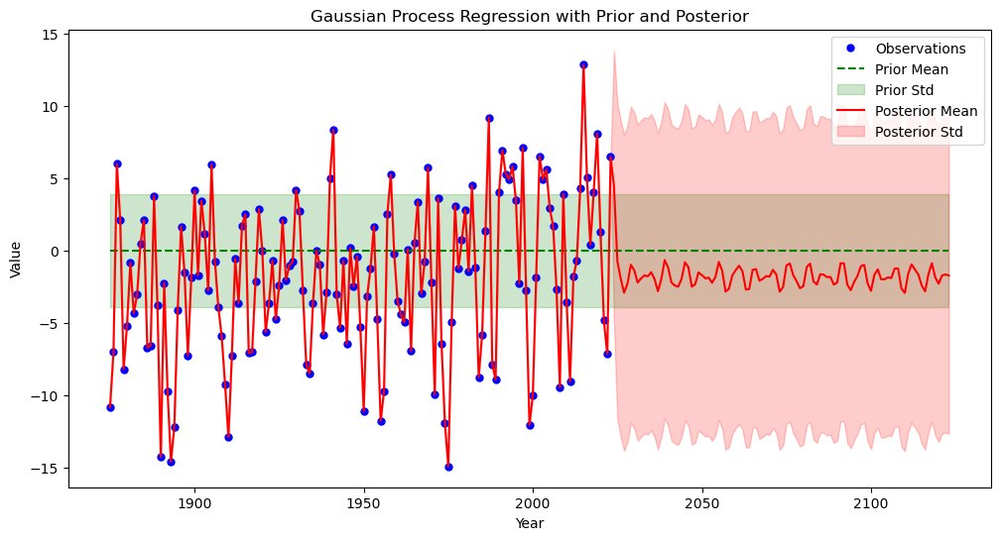

(0.00316**2 + ExpSineSquared(length_scale=10, periodicity=3.28) + ExpSineSquared(length_scale=7.91, periodicity=5.2) + ExpSineSquared(length_scale=10, periodicity=7.37) + RBF(length_scale=0.802) + WhiteKernel(noise_level=1e-10),
 -196.31669694068523,
 60.18004530088747)

In [15]:
# Define the composite kernel with a smaller number of periodic components
periodicities = [3, 5, 7]  # Reduced to three periodicities
periodic_kernels = [ExpSineSquared(length_scale=1.0, periodicity=p, length_scale_bounds=(1e-2, 1e1), periodicity_bounds=(1e-2, 1e1)) for p in periodicities]
composite_periodic_kernel = sum(periodic_kernels)
kernel = composite_periodic_kernel + RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e1)) + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-10, 1e1))

# Fit the GPR model with the composite kernel
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=5, normalize_y=True)  # Reduced the number of restarts
gpr.fit(X, y)

# Predict the posterior using the fitted model
y_pred, y_std = gpr.predict(X_all, return_std=True)

# Calculate the log marginal likelihood and mean squared error
optimized_lml = gpr.log_marginal_likelihood()
optimized_mse = np.mean((gpr.predict(X) - y) ** 2)

plot_prior_posterior(gpr, X, y, X_all, y_pred, y_std)

# Output the optimized kernel parameters, log marginal likelihood, and mean squared error
optimized_kernel = gpr.kernel_
optimized_kernel, optimized_lml, optimized_mse


## poly + pe + wn

d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:479: UserWarning: Predicted variances smaller than 0. Setting those variances to 0.
  warnings.warn(


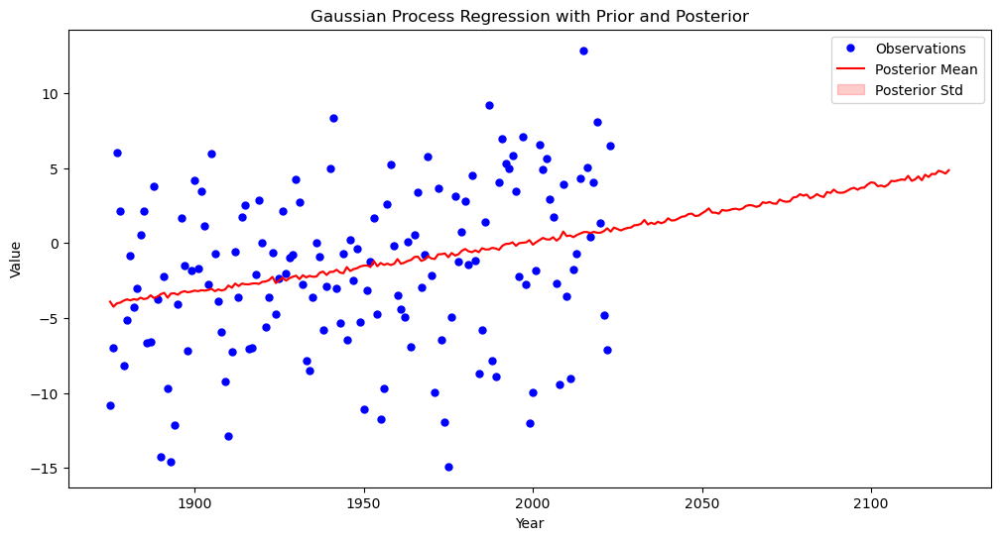

(CustomPolynomialKernel(sigma_0=1) + ExpSineSquared(length_scale=1, periodicity=1) + WhiteKernel(noise_level=1),
 -230.09604548635886,
 32.16043857252561)

In [16]:
from sklearn.gaussian_process.kernels import DotProduct

# Define a custom polynomial kernel using the dot product kernel
class CustomPolynomialKernel(DotProduct):
    def __init__(self, degree=3, sigma_0=1):
        super().__init__(sigma_0=sigma_0)
        self.degree = degree

    def __call__(self, X, Y=None, eval_gradient=False):
        K = super().__call__(X, Y)
        if eval_gradient:
            return K**self.degree, self.degree * K**(self.degree - 1)
        else:
            return K**self.degree

# Define the composite kernel: Custom Polynomial kernel + Periodic kernel + White noise kernel
poly_kernel = CustomPolynomialKernel(degree=2)
periodic_kernel = ExpSineSquared(length_scale=1.0, periodicity=1.0, length_scale_bounds=(1e-2, 1e1), periodicity_bounds=(1e-2, 1e1))
white_noise_kernel = WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-10, 1e1))

kernel = poly_kernel + periodic_kernel + white_noise_kernel

# Fit the GPR model with the composite kernel
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, normalize_y=True)
gpr.fit(X, y)

# Predict the posterior using the fitted model
y_pred, y_std = gpr.predict(X_all, return_std=True)

# Calculate the log marginal likelihood and mean squared error
optimized_lml = gpr.log_marginal_likelihood()
optimized_mse = np.mean((gpr.predict(X) - y) ** 2)


# Plot the prior and posterior means and stds
plot_prior_posterior(gpr, X, y, X_all, y_pred, y_std)

# Output the optimized kernel parameters, log marginal likelihood, and mean squared error
optimized_kernel = gpr.kernel_
optimized_kernel, optimized_lml, optimized_mse


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:284: RuntimeWarning: divide by zero encountered in log
  return np.log(np.hstack(theta))
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__k1__k1__k1__k2__periodicity is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1_

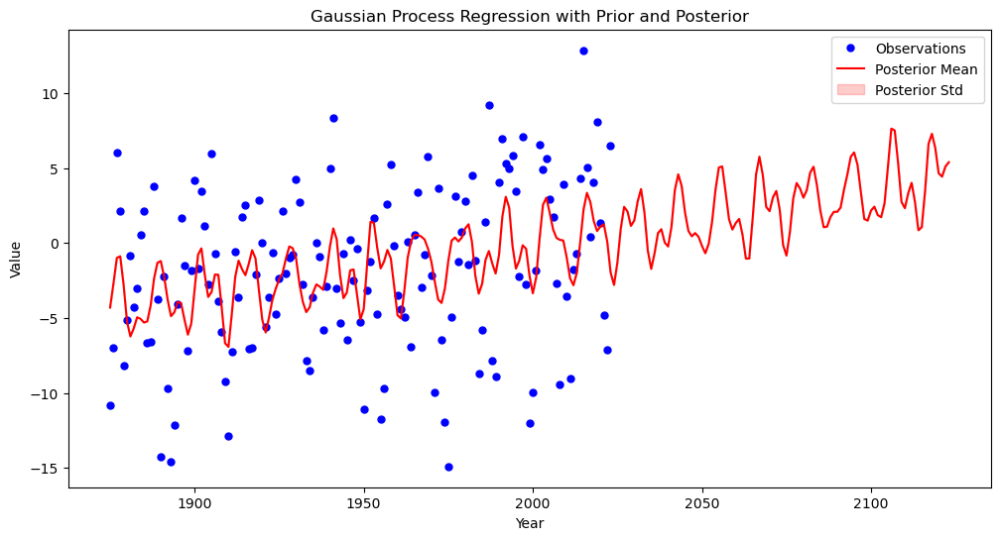

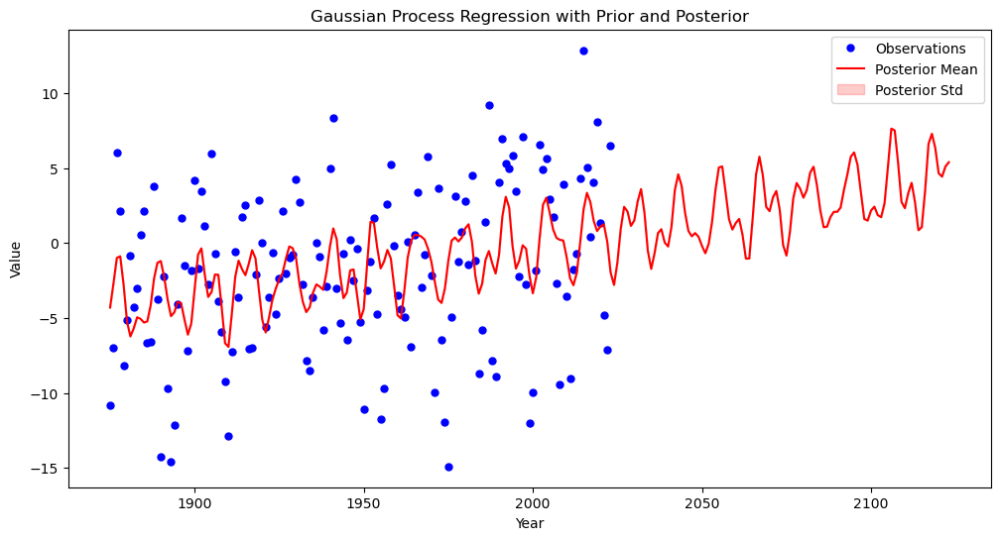

(CustomPolynomialKernel(sigma_0=0.691) + 0.00316**2 + ExpSineSquared(length_scale=1.74, periodicity=10) + ExpSineSquared(length_scale=3.15, periodicity=10) + ExpSineSquared(length_scale=5.34, periodicity=5.7) + ExpSineSquared(length_scale=2.34, periodicity=0.0839) + ExpSineSquared(length_scale=5.36, periodicity=10) + WhiteKernel(noise_level=1.44),
 -235.8220172725503,
 35.18117892127536)

In [17]:
# Define the composite kernel with multiple periodic components and a custom polynomial kernel
periodicities = [3, 4, 5, 6, 7]  # Periodic components with periods 3, 4, 5, 6, and 7 years
periodic_kernels = [ExpSineSquared(length_scale=1.0, periodicity=p, length_scale_bounds=(1e-2, 1e1), periodicity_bounds=(1e-2, 1e1)) for p in periodicities]
composite_periodic_kernel = sum(periodic_kernels)
poly_kernel = CustomPolynomialKernel(degree=2)
white_noise_kernel = WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-10, 1e1))

# Combine the kernels
kernel = poly_kernel + composite_periodic_kernel + white_noise_kernel

# Fit the GPR model with the composite kernel
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, normalize_y=True)
gpr.fit(X, y)

# Predict the posterior using the fitted model
y_pred, y_std = gpr.predict(X_all, return_std=True)

# Calculate the log marginal likelihood and mean squared error
optimized_lml = gpr.log_marginal_likelihood()
optimized_mse = np.mean((gpr.predict(X) - y) ** 2)

def plot_prior_posterior(gpr, X, y, X_all, y_pred, y_std):
    # Prior: Using the initial kernel without fitting
    kernel = gpr.kernel_
    gpr_prior = GaussianProcessRegressor(kernel=kernel, normalize_y=True)
    y_prior_mean, y_prior_std = gpr_prior.predict(X_all, return_std=True)
    
    plt.figure(figsize=(12, 6))
    
    # Plot observations
    plt.plot(X, y, 'b.', markersize=10, label='Observations')
    
    # # Plot prior mean and std
    # plt.plot(X_all, y_prior_mean, 'g--', label='Prior Mean')
    # plt.fill_between(X_all.ravel(), y_prior_mean - 1.96 * y_prior_std, y_prior_mean + 1.96 * y_prior_std, alpha=0.2, color='g', label='Prior Std')
    
    # Plot posterior mean and std
    plt.plot(X_all, y_pred, 'r-', label='Posterior Mean')
    plt.fill_between(X_all.ravel(), y_pred - 1.96 * y_std, y_pred + 1.96 * y_std, alpha=0.2, color='r', label='Posterior Std')
    
    plt.xlabel('Year')
    plt.ylabel('Value')
    plt.title('Gaussian Process Regression with Prior and Posterior')
    plt.legend()
    plt.show()

# Plot the prior and posterior means and stds
plot_prior_posterior(gpr, X, y, X_all, y_pred, y_std)
# Plot the prior and posterior means and stds
plot_prior_posterior(gpr, X, y, X_all, y_pred, y_std)

# Output the optimized kernel parameters, log marginal likelihood, and mean squared error
optimized_kernel = gpr.kernel_
optimized_kernel, optimized_lml, optimized_mse


## sum of periods

In [18]:
def plot_gpr_samples(gpr_model, X, y, n_samples, X_range, ax):
    """Plot samples drawn from the Gaussian process model and the fitted data.
    
    If the Gaussian process model is not trained then the drawn samples are
    drawn from the prior distribution. Otherwise, the samples are drawn from
    the posterior distribution. Be aware that a sample here corresponds to a
    function.

    Parameters
    ----------
    gpr_model : `GaussianProcessRegressor`
        A :class:`~sklearn.gaussian_process.GaussianProcessRegressor` model.
    n_samples : int
        The number of samples to draw from the Gaussian process distribution.
    X_range : tuple
        The range of X values to use for the prediction.
    ax : matplotlib axis
        The matplotlib axis where to plot the samples.
    """
    X_pred = np.linspace(X_range[0], X_range[1], 1000).reshape(-1, 1)
    y_mean, y_std = gpr_model.predict(X_pred, return_std=True)
    y_samples = gpr_model.sample_y(X_pred, n_samples)

    # Plot the original data points and the fitted curve
    ax.plot(X, y, 'orange', label='Observed Data')
    ax.plot(X_pred, y_mean, color="black", label="Fitted Mean")

    for idx, single_prior in enumerate(y_samples.T):
        ax.plot(
            X_pred,
            single_prior,
            linestyle="--",
            alpha=0.7,
            label=f"Sampled function #{idx + 1}",
        )
    ax.fill_between(
        X_pred.ravel(),
        y_mean - y_std,
        y_mean + y_std,
        alpha=0.1,
        color="black",
        label=r"$\pm$ 1 std. dev.",
    )
    ax.set_xlabel("Year")
    ax.set_ylabel("ENSO Index")
    ax.legend()
    ax.set_ylim([min(y_mean - y_std) - 5, max(y_mean + y_std) + 5])

### 5 periods(3,4,5,6,7)

  0%|          | 0/2500 [00:00<?, ?it/s]d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k2__length_scale is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a b

Best Period1: 7.795918367346939, Best Period2: 8.53061224489796, Best LML: -100.40045608340483


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:479: UserWarning: Predicted variances smaller than 0. Setting those variances to 0.
  warnings.warn(


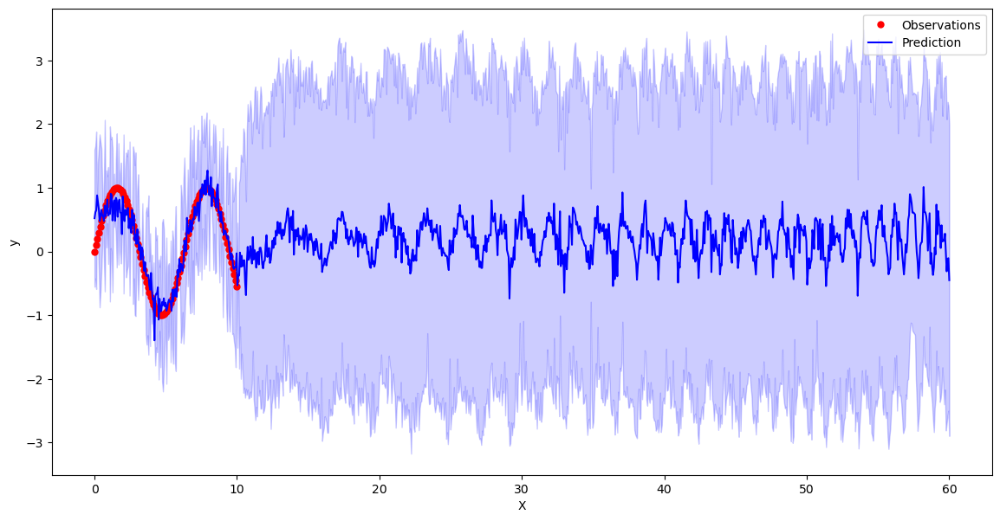

In [19]:
# fake data sin(x)

# Define the custom kernel with RBF, periodic components, and white noise
kernel = (
    C(1.0, (1e-1, 1e1)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=3.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=4.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=5.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=6.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=7.0, length_scale_bounds=(1e-2, 1e2)) +
    WhiteKernel(noise_level=1e-1, noise_level_bounds=(1e-3, 1e1))
)

# Initialize Gaussian Process model
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, alpha=1e0)

# Define the function for periodic transformation
def periodic_transform(X, periods):
    return np.hstack([np.sin(2 * np.pi * X / p) for p in periods] + [np.cos(2 * np.pi * X / p) for p in periods])

# Simulate input data (replace with actual data)
X = enso_data.iloc[:, 0].values.reshape(-1, 1).astype(float)
Y = enso_data.iloc[:, 1].values.reshape(-1, 1)
y = enso_data.iloc[:, 1].values.reshape(-1, 1)

# Perform Maximum Likelihood Estimation for periods
log_marginal_likelihood = []
period1_bounds = (1.0, 10.0)
period2_bounds = (1.0, 10.0)
period1_range = np.linspace(period1_bounds[0], period1_bounds[1], 50)
period2_range = np.linspace(period2_bounds[0], period2_bounds[1], 50)

poly = PolynomialFeatures(degree=2)

# Add progress bar
total_iterations = len(period1_range) * len(period2_range)
with tqdm(total=total_iterations) as pbar:
    for period1 in period1_range:
        for period2 in period2_range:
            X_periodic = periodic_transform(X, [period1, period2])
            X_poly = poly.fit_transform(np.hstack([X, X_periodic]))
            try:
                gp.fit(X_poly, y)
                lml = gp.log_marginal_likelihood()
                log_marginal_likelihood.append((period1, period2, lml))
            except Exception as e:
                log_marginal_likelihood.append((period1, period2, -np.inf))
            pbar.update(1)

# Find the best periods
best_period1, best_period2, best_lml = max(log_marginal_likelihood, key=lambda x: x[2])
print(f"Best Period1: {best_period1}, Best Period2: {best_period2}, Best LML: {best_lml}")

# Plot the prediction with the best periods
X_periodic = periodic_transform(X, [best_period1, best_period2])
X_poly = poly.fit_transform(np.hstack([X, X_periodic]))
gp.fit(X_poly, y)

fig, ax = plt.subplots(figsize=(14, 7))
# Function to plot GPR samples (replace with actual implementation)
def plot_gpr_samples(gp, X, y, poly, periods, n_samples, X_range, ax):
    X_test = np.linspace(X_range[0], X_range[1], 1000).reshape(-1, 1)
    X_periodic_test = periodic_transform(X_test, periods)
    X_poly_test = poly.transform(np.hstack([X_test, X_periodic_test]))
    y_mean, y_std = gp.predict(X_poly_test, return_std=True)
    ax.plot(X, y, 'r.', markersize=10, label='Observations')
    ax.plot(X_test, y_mean, 'b-', label='Prediction')
    ax.fill_between(X_test.ravel(), y_mean - 1.96 * y_std, y_mean + 1.96 * y_std, alpha=0.2, color='b')
    ax.set_xlabel('X')
    ax.set_ylabel('y')
    ax.legend()

plot_gpr_samples(gp, X, y, poly, [best_period1, best_period2], n_samples=5, X_range=(X.min(), X.max() + 50), ax=ax)
plt.show()


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warni

Optimized Polynomial kernel with periodic components: 0.316**2 * DotProduct(sigma_0=0.0352) ** 2 + 1.71**2 * ExpSineSquared(length_scale=8.29, periodicity=281) + 0.374**2 * ExpSineSquared(length_scale=2.57, periodicity=8.62e+04) + 0.333**2 * ExpSineSquared(length_scale=27.8, periodicity=300) + 3.16**2 * ExpSineSquared(length_scale=0.0181, periodicity=23.4) + 1.31**2 * ExpSineSquared(length_scale=1.48, periodicity=1e+05) + WhiteKernel(noise_level=10)


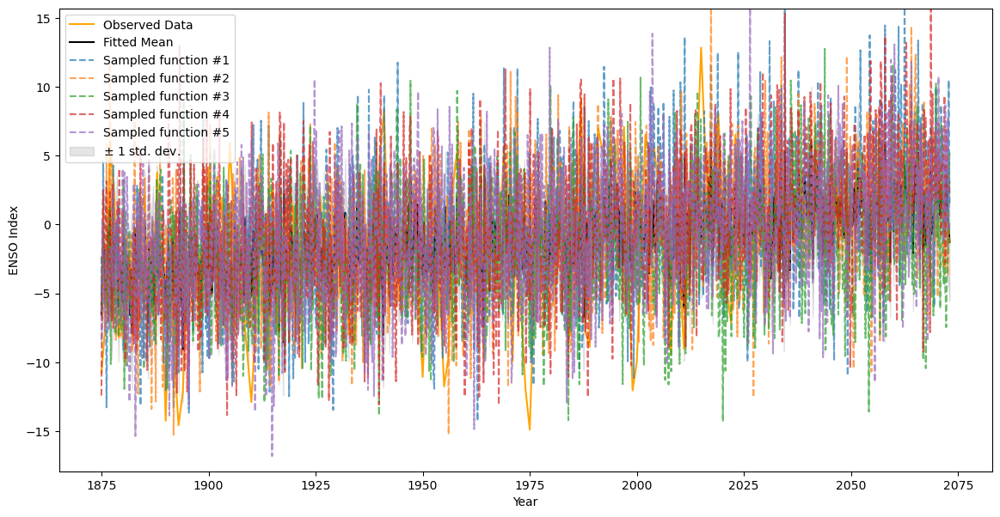

In [44]:
# Load the ENSO data
X = enso_data['Year'].values.reshape(-1, 1)
y = enso_data['Value'].values

kernel = (
    C(1.0, (1e-1, 1e1)) * (DotProduct() ** 2) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=3.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=4.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=5.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=6.0, length_scale_bounds=(1e-2, 1e2)) +
    C(1.0, (1e-1, 1e1)) * ExpSineSquared(length_scale=1.0, periodicity=7.0, length_scale_bounds=(1e-2, 1e2)) +
    WhiteKernel(noise_level=1e-1, noise_level_bounds=(1e-3, 1e1))
)


# Fit the Gaussian Process model with parameter optimization, including noise term
gp_poly_periodic = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, alpha=1e-1)
gp_poly_periodic.fit(X, y)

# Print the optimized kernel parameters
print("Optimized Polynomial kernel with periodic components:", gp_poly_periodic.kernel_)

# Create a plot
fig, ax = plt.subplots(figsize=(14, 7))
plot_gpr_samples(gp_poly_periodic, X, y, n_samples=5, X_range=(X.min(), X.max() + 50), ax=ax)
plt.show()

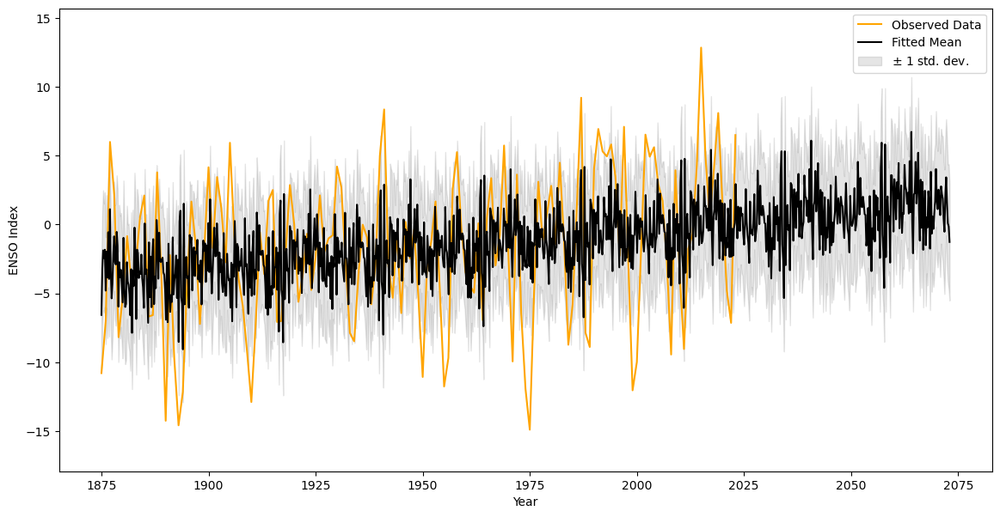

In [45]:
fig, ax = plt.subplots(figsize=(14, 7))
plot_gpr_samples(gp_poly_periodic, X, y, n_samples=0, X_range=(X.min(), X.max() + 50), ax=ax)
plt.show()

In [46]:
print("Optimized Polynomial kernel with periodic components:", gp_poly_periodic.kernel_)

# Calculate and print the log marginal likelihood
lml = gp_poly_periodic.log_marginal_likelihood()
print("Log Marginal Likelihood (LML):", lml)

# Predict and calculate the mean squared error
y_pred, sigma = gp_poly_periodic.predict(X, return_std=True)
mse = mean_squared_error(y, y_pred)
print("Mean Squared Error (MSE):", mse)


Optimized Polynomial kernel with periodic components: 0.316**2 * DotProduct(sigma_0=0.0352) ** 2 + 1.71**2 * ExpSineSquared(length_scale=8.29, periodicity=281) + 0.374**2 * ExpSineSquared(length_scale=2.57, periodicity=8.62e+04) + 0.333**2 * ExpSineSquared(length_scale=27.8, periodicity=300) + 3.16**2 * ExpSineSquared(length_scale=0.0181, periodicity=23.4) + 1.31**2 * ExpSineSquared(length_scale=1.48, periodicity=1e+05) + WhiteKernel(noise_level=10)
Log Marginal Likelihood (LML): -483.88708785011283
Mean Squared Error (MSE): 7.608913730174096


### 5 periods(1-10, 10-100)

In [53]:
def gp_target(c1, c2, ls1, per1, ls2, per2, ls3, per3, ls4, per4, ls5, per5, noise):
    kernel = (
        C(c1) * (DotProduct() ** 2) +
        C(c2) * ExpSineSquared(length_scale=ls1, periodicity=per1) +
        C(c2) * ExpSineSquared(length_scale=ls2, periodicity=per2) +
        C(c2) * ExpSineSquared(length_scale=ls3, periodicity=per3) +
        C(c2) * ExpSineSquared(length_scale=ls4, periodicity=per4) +
        C(c2) * ExpSineSquared(length_scale=ls5, periodicity=per5) +
        WhiteKernel(noise_level=noise)
    )
    gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
    gp.fit(X, y)
    return gp.log_marginal_likelihood()

# Define the parameter bounds for Bayesian optimization
pbounds = {
    'c1': (1e-1, 1e1),
    'c2': (1e-1, 1e1),
    'ls1': (1e-2, 1e2),
    'per1': (1.0, 10.0),
    'ls2': (1e-2, 1e2),
    'per2': (1.0, 10.0),
    'ls3': (1e-2, 1e2),
    'per3': (1.0, 10.0),
    'ls4': (1e-2, 1e2),
    'per4': (10, 100),
    'ls5': (1e-2, 1e2),
    'per5': (10, 100),
    'noise': (1e-3, 1e1),
}

# Create a BayesianOptimization object
optimizer = BayesianOptimization(
    f=gp_target,
    pbounds=pbounds,
    random_state=42
)

# Perform optimization
optimizer.maximize(
    init_points=10,
    n_iter=40
)

# Print the best parameters
print("Best parameters found: ", optimizer.max)

# Use the best parameters to train the final model
best_params = optimizer.max['params']
kernel = (
    C(best_params['c1']) * (DotProduct() ** 2) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls4'], periodicity=best_params['per4']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls5'], periodicity=best_params['per5']) +
    WhiteKernel(noise_level=best_params['noise'])
)
gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
gp.fit(X, y)

# Perform predictions
X_test = np.random.rand(10, 1)  # Replace with your actual test data
y_pred, y_std = gp.predict(X_test, return_std=True)
print("Predictions: ", y_pred)
print("Uncertainties: ", y_std)


|   iter    |  target   |    c1     |    c2     |    ls1    |    ls2    |    ls3    |    ls4    |    ls5    |   noise   |   per1    |   per2    |   per3    |   per4    |   per5    |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better

| 1         | -455.6    | 3.808     | 9.512     | 73.2      | 59.87     | 15.61     | 15.61     | 5.818     | 8.662     | 6.41      | 7.373     | 1.185     | 97.29     | 84.92     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 2         | -471.9    | 2.202     | 1.9       | 18.35     | 30.43     | 52.48     | 43.2      | 29.13     | 6.119     | 2.255     | 3.629     | 4.297     | 51.05     | 80.67     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.


| 3         | -455.6    | 2.077     | 5.191     | 59.25     | 4.655     | 60.76     | 17.06     | 6.515     | 9.489     | 9.691     | 8.276     | 3.742     | 18.79     | 71.58     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 4         | -472.9    | 4.458     | 1.308     | 49.52     | 3.449     | 90.93     | 25.89     | 66.26     | 3.118     | 5.681     | 5.92      | 2.664     | 97.26     | 79.76     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 5         | -455.6    | 9.401     | 8.959     | 59.79     | 92.19     | 8.858     | 19.61     | 4.532     | 3.254     | 4.498     | 3.442     | 8.459     | 42.11     | 35.28     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 6         | -472.0    | 5.473     | 1.495     | 80.22     | 7.464     | 98.69     | 77.23     | 19.88     | 0.05622   | 8.339     | 7.362     | 7.561     | 79.41     | 16.66     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 7         | -467.5    | 3.649     | 1.247     | 86.31     | 62.33     | 33.1      | 6.365     | 31.11     | 3.253     | 7.566     | 6.738     | 8.985     | 52.5      | 20.76     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 8         | -455.6    | 7.161     | 7.632     | 56.13     | 77.1      | 49.38     | 52.28     | 42.76     | 0.2552    | 1.971     | 1.283     | 6.728     | 38.29     | 55.77     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 9         | -471.9    | 9.085     | 2.568     | 41.04     | 75.56     | 22.89     | 7.707     | 28.98     | 1.613     | 9.367     | 8.273     | 6.701     | 88.43     | 82.33     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k2__kernel__sigma_0 is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a bette

| 10        | -471.3    | 1.947     | 8.936     | 53.94     | 80.75     | 89.61     | 31.81     | 11.01     | 2.28      | 4.844     | 8.362     | 8.747     | 10.63     | 55.97     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  wa

| 11        | -471.9    | 1.227     | 9.447     | 97.76     | 5.386     | 0.3552    | 94.81     | 9.05      | 2.691     | 5.269     | 2.425     | 4.739     | 93.46     | 89.85     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 12        | -474.0    | 0.6336    | 4.616     | 44.05     | 18.49     | 47.7      | 26.54     | 55.12     | 3.027     | 4.573     | 9.834     | 2.9       | 94.89     | 40.79     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 13        | -475.7    | 2.487     | 5.249     | 59.55     | 70.45     | 41.8      | 42.73     | 71.59     | 1.026     | 3.619     | 3.263     | 1.405     | 48.88     | 88.21     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 14        | -466.5    | 5.839     | 6.884     | 64.55     | 83.46     | 8.251     | 16.98     | 4.446     | 6.096     | 9.226     | 4.255     | 8.811     | 45.7      | 45.5      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 15        | -471.8    | 9.999     | 9.885     | 57.65     | 96.11     | 9.363     | 21.02     | 4.8       | 2.206     | 2.605     | 3.074     | 8.528     | 40.49     | 30.69     |
| 16        | -466.6    | 7.975     | 7.218     | 38.16     | 53.04     | 49.26     | 23.36     | 49.99     | 7.847     | 7.954     | 6.597     | 4.753     | 23.67     | 44.79     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 17        | -471.9    | 5.036     | 4.666     | 66.74     | 82.51     | 54.94     | 44.48     | 39.73     | 7.349     | 6.59      | 6.229     | 7.007     | 54.01     | 36.97     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 18        | -465.0    | 4.916     | 3.862     | 66.31     | 14.35     | 80.8      | 25.06     | 71.49     | 2.136     | 3.868     | 8.325     | 5.741     | 33.05     | 16.25     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 19        | -468.8    | 5.499     | 7.539     | 99.99     | 78.07     | 16.99     | 70.05     | 20.5      | 1.72      | 2.019     | 5.409     | 8.42      | 75.66     | 45.28     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 20        | -455.6    | 1.388     | 4.644     | 71.31     | 49.9      | 18.72     | 29.11     | 9.03      | 5.532     | 4.713     | 7.899     | 2.468     | 29.96     | 45.14     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__periodicity is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  w

| 21        | -471.3    | 1.482     | 2.463     | 18.88     | 47.21     | 81.8      | 84.75     | 12.65     | 6.654     | 6.817     | 5.201     | 5.944     | 83.83     | 11.64     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  wa

| 22        | -466.5    | 4.924     | 0.1722    | 14.16     | 43.47     | 95.72     | 5.921     | 35.26     | 3.11      | 7.929     | 6.337     | 3.279     | 89.12     | 35.63     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 23        | -471.9    | 3.888     | 6.273     | 10.12     | 51.88     | 5.176     | 25.42     | 74.89     | 5.064     | 8.639     | 5.228     | 3.26      | 74.69     | 62.43     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnin

| 24        | -467.6    | 7.012     | 5.583     | 86.75     | 69.77     | 16.96     | 69.22     | 35.18     | 7.458     | 6.617     | 6.787     | 3.541     | 86.55     | 82.85     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 25        | -467.6    | 3.757     | 8.53      | 84.37     | 58.66     | 91.49     | 22.21     | 31.49     | 7.901     | 2.335     | 4.197     | 7.283     | 46.28     | 22.59     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 26        | -468.7    | 4.724     | 1.959     | 79.55     | 90.75     | 96.27     | 25.07     | 29.52     | 8.22      | 3.716     | 6.031     | 1.27      | 30.96     | 29.08     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.


| 27        | -472.0    | 0.9845    | 5.027     | 17.97     | 67.96     | 92.59     | 99.02     | 92.7      | 4.965     | 6.363     | 2.318     | 1.375     | 94.43     | 70.81     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 28        | -471.9    | 9.141     | 6.381     | 77.27     | 64.76     | 22.09     | 62.33     | 82.45     | 4.01      | 2.125     | 5.154     | 6.278     | 85.79     | 56.94     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k2__periodicity is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 29        | -455.6    | 5.001     | 8.125     | 25.97     | 90.02     | 41.72     | 58.68     | 44.49     | 8.457     | 7.732     | 6.181     | 7.623     | 32.19     | 40.24     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 30        | -468.8    | 0.1842    | 5.925     | 30.69     | 26.07     | 68.81     | 21.31     | 64.76     | 9.688     | 7.101     | 7.936     | 5.28      | 32.93     | 52.79     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 31        | -471.9    | 7.726     | 1.067     | 69.44     | 49.42     | 84.81     | 5.971     | 11.99     | 8.95      | 9.744     | 4.964     | 4.877     | 63.76     | 84.02     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 32        | -468.8    | 6.394     | 2.276     | 78.67     | 57.87     | 7.096     | 96.02     | 29.97     | 7.757     | 8.251     | 4.141     | 6.033     | 46.63     | 41.06     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better

| 33        | -468.0    | 1.402     | 4.658     | 71.32     | 49.92     | 18.74     | 29.12     | 9.044     | 5.546     | 4.727     | 7.913     | 2.482     | 29.97     | 45.16     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 34        | -472.0    | 9.766     | 0.1834    | 45.19     | 53.45     | 1.092     | 69.76     | 38.58     | 3.159     | 2.237     | 5.035     | 6.637     | 95.05     | 52.74     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better val

| 35        | -455.6    | 7.089     | 6.277     | 19.24     | 73.24     | 73.77     | 71.77     | 39.96     | 6.1       | 4.833     | 4.189     | 5.681     | 80.52     | 96.79     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 36        | -465.4    | 5.71      | 1.503     | 8.357     | 57.23     | 0.4205    | 27.47     | 43.61     | 7.355     | 4.049     | 8.456     | 1.505     | 87.67     | 53.45     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better

| 37        | -472.0    | 2.484     | 2.875     | 53.27     | 57.76     | 38.18     | 8.869     | 88.28     | 3.381     | 4.929     | 8.333     | 7.611     | 64.67     | 42.72     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 38        | -464.7    | 5.073     | 6.009     | 85.2      | 21.0      | 26.74     | 41.1      | 76.46     | 6.261     | 9.421     | 9.487     | 3.894     | 93.62     | 62.58     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 39        | -468.4    | 6.408     | 1.814     | 65.13     | 95.82     | 36.24     | 12.11     | 6.034     | 0.1065    | 9.385     | 1.879     | 8.07      | 85.07     | 68.96     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 40        | -462.5    | 2.116     | 9.618     | 71.68     | 0.06152   | 47.62     | 36.92     | 3.145     | 0.7571    | 9.787     | 4.665     | 7.732     | 56.28     | 98.58     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 41        | -467.1    | 8.366     | 8.951     | 70.0      | 48.38     | 38.9      | 18.76     | 44.75     | 5.05      | 3.463     | 7.223     | 7.513     | 44.92     | 77.68     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 42        | -470.4    | 1.171     | 4.014     | 28.26     | 97.84     | 15.3      | 29.23     | 27.28     | 6.694     | 3.951     | 3.966     | 7.145     | 89.59     | 76.53     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k2__kernel__sigma_0 is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a bette

| 43        | -463.8    | 1.747     | 1.474     | 4.968     | 35.6      | 98.93     | 91.9      | 83.42     | 4.311     | 9.658     | 6.211     | 3.12      | 65.53     | 65.24     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 44        | -455.6    | 2.244     | 4.368     | 68.98     | 39.05     | 97.61     | 7.869     | 93.19     | 1.385     | 3.564     | 9.927     | 9.382     | 69.07     | 76.02     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 45        | -464.6    | 4.404     | 9.56      | 78.47     | 48.11     | 64.35     | 13.74     | 83.88     | 9.523     | 8.772     | 2.318     | 2.531     | 74.69     | 73.07     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 46        | -468.8    | 1.072     | 1.937     | 87.51     | 77.54     | 46.23     | 13.51     | 81.65     | 5.75      | 2.854     | 6.289     | 8.026     | 63.65     | 88.47     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 47        | -455.6    | 1.264     | 7.496     | 22.04     | 47.72     | 78.35     | 76.63     | 37.0      | 9.117     | 3.408     | 7.619     | 9.256     | 91.22     | 91.78     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 48        | -471.9    | 1.008     | 1.993     | 60.59     | 52.76     | 4.159     | 97.45     | 23.0      | 1.364     | 1.625     | 3.094     | 6.711     | 36.8      | 55.85     |
| 49        | -472.7    | 8.371     | 5.613     | 45.11     | 94.25     | 58.38     | 35.96     | 5.048     | 2.463     | 5.762     | 2.635     | 9.348     | 96.96     | 89.48     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 50        | -471.9    | 0.345     | 6.092     | 9.896     | 65.72     | 83.75     | 24.0      | 65.44     | 7.746     | 6.216     | 3.129     | 4.547     | 57.21     | 50.31     |
Best parameters found:  {'target': -455.55172223885813, 'params': {'c1': 1.263673457405405, 'c2': 7.495760319182658, 'ls1': 22.036451616051515, 'ls2': 47.71748806087719, 'ls3': 78.34659943546042, 'ls4': 76.62742354172053, 'ls5': 36.9965843480737, 'noise': 9.117331451662587, 'per1': 3.4082366438450533, 'per2': 7.6192271169137396, 'per3': 9.255517267720348, 'per4': 91.21771794478613, 'per5': 91.77728221186685}}


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


Predictions:  [-17.17264461 -17.22755875 -17.17401905 -17.2438838  -17.16758162
 -17.18061044 -17.25566056 -17.22019593 -17.1737446  -17.19189735]
Uncertainties:  [17.93192534 17.92452822 17.92628018 17.93003305 17.9325257  17.93334694
 17.92920458 17.93059238 17.92652539 17.92747574]


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


In [55]:
best_params

{'c1': 1.263673457405405,
 'c2': 7.495760319182658,
 'ls1': 22.036451616051515,
 'ls2': 47.71748806087719,
 'ls3': 78.34659943546042,
 'ls4': 76.62742354172053,
 'ls5': 36.9965843480737,
 'noise': 9.117331451662587,
 'per1': 3.4082366438450533,
 'per2': 7.6192271169137396,
 'per3': 9.255517267720348,
 'per4': 91.21771794478613,
 'per5': 91.77728221186685}

d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


Log Marginal Likelihood: -471.9156160575926
Mean Squared Error: 0.00032566065671664734


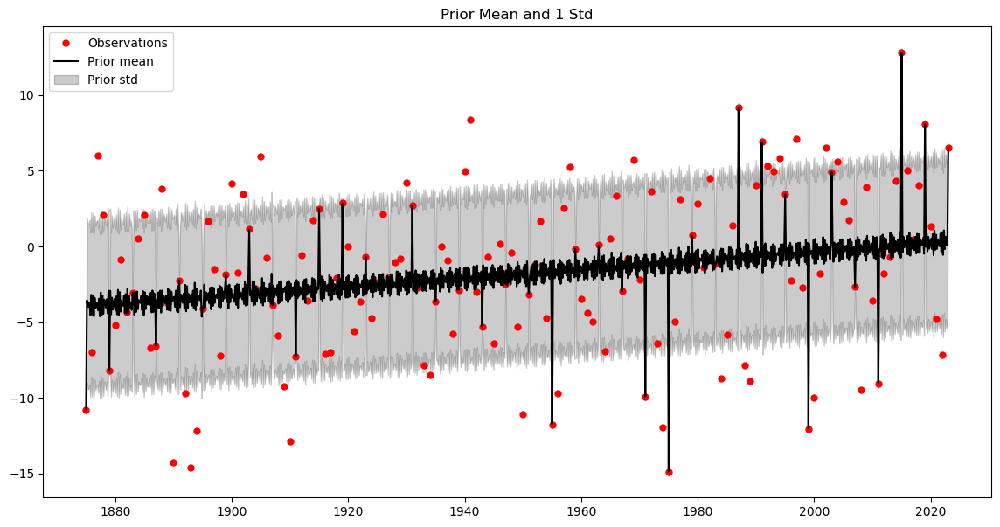

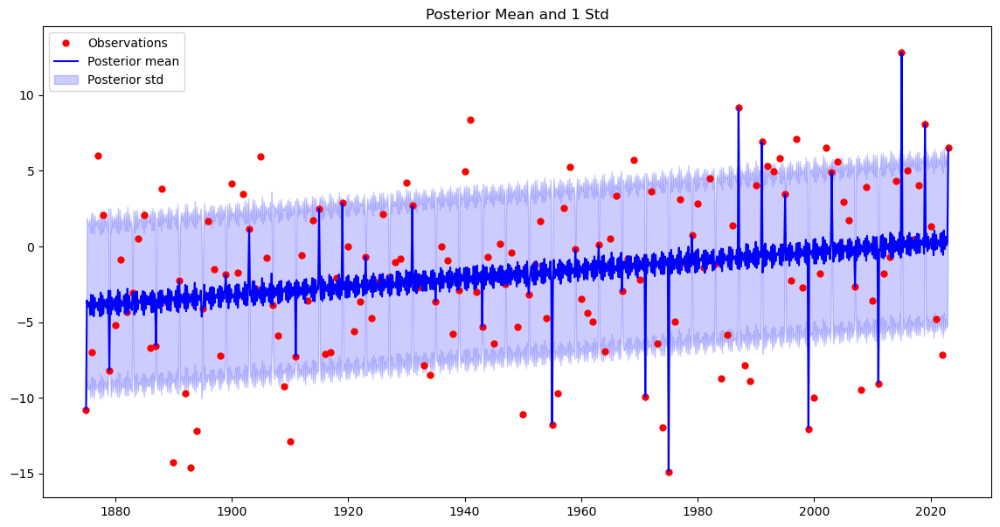

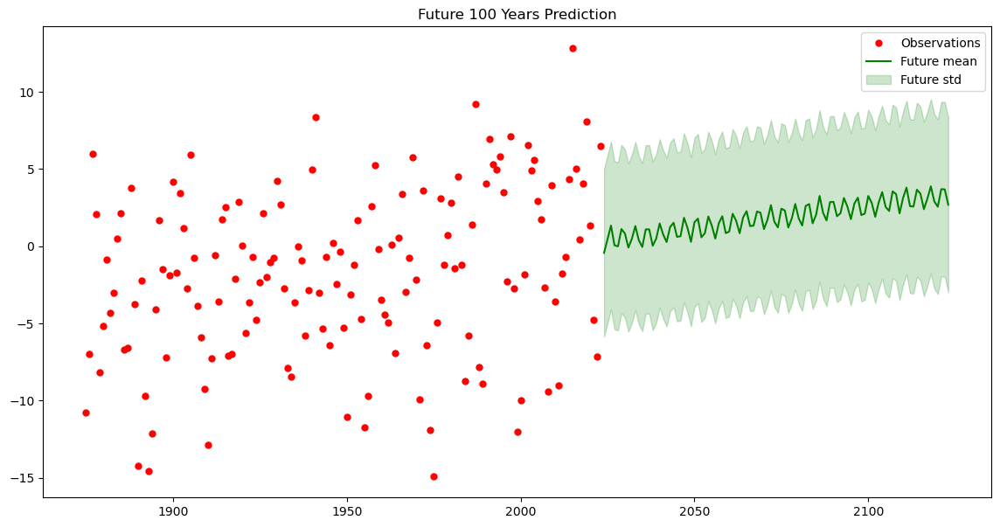

In [54]:
# Use the best parameters to train the final model
kernel = (
    C(best_params['c1']) * (DotProduct() ** 2) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls4'], periodicity=best_params['per4']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls5'], periodicity=best_params['per5']) +
    WhiteKernel(noise_level=best_params['noise'])
)
gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
gp.fit(X, y)


y_pred_train, y_std_train = gp.predict(X, return_std=True)
mse = mean_squared_error(y, y_pred_train)
print(f"Log Marginal Likelihood: {gp.log_marginal_likelihood()}")
print(f"Mean Squared Error: {mse}")

# Plot prior mean and 1 std
X_plot = np.linspace(X.min(), X.max(), 1000).reshape(-1, 1)
y_pred_prior, y_std_prior = gp.predict(X_plot, return_std=True)

plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X_plot, y_pred_prior, 'k-', label='Prior mean')
plt.fill_between(X_plot.ravel(), y_pred_prior - y_std_prior, y_pred_prior + y_std_prior, alpha=0.2, color='k', label='Prior std')
plt.title('Prior Mean and 1 Std')
plt.legend()
plt.show()

# Plot posterior mean and 1 std
y_pred_post, y_std_post = gp.predict(X_plot, return_std=True)

plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X_plot, y_pred_post, 'b-', label='Posterior mean')
plt.fill_between(X_plot.ravel(), y_pred_post - y_std_post, y_pred_post + y_std_post, alpha=0.2, color='b', label='Posterior std')
plt.title('Posterior Mean and 1 Std')
plt.legend()
plt.show()

# Predict future 100 years
X_future = np.arange(X.max() + 1, X.max() + 101).reshape(-1, 1)
y_pred_future, y_std_future = gp.predict(X_future, return_std=True)

plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X_future, y_pred_future, 'g-', label='Future mean')
plt.fill_between(X_future.ravel(), y_pred_future - y_std_future, y_pred_future + y_std_future, alpha=0.2, color='g', label='Future std')
plt.title('Future 100 Years Prediction')
plt.legend()
plt.show()

Log Marginal Likelihood: -471.9156160575926
Mean Squared Error: 0.00032566065671664734


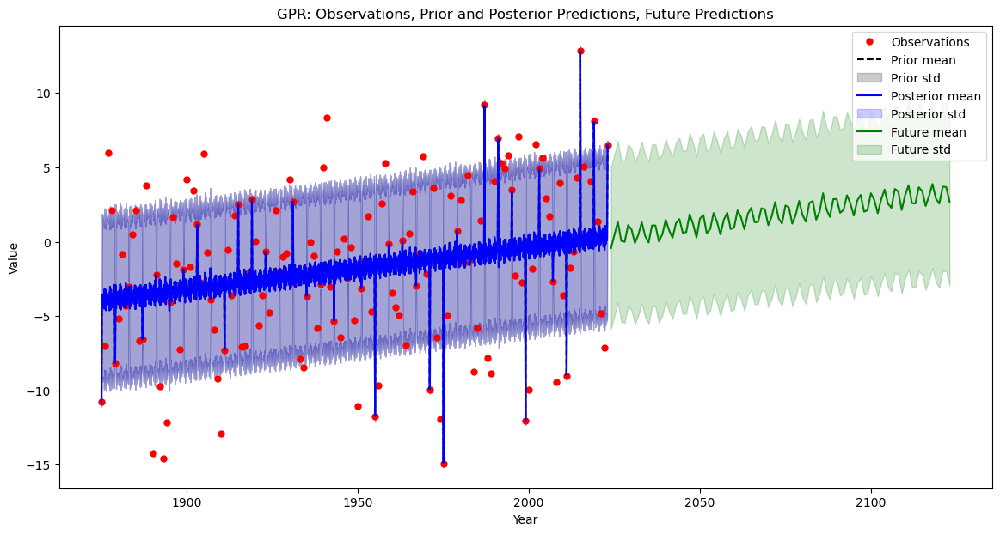

In [56]:
y_pred_train, y_std_train = gp.predict(X, return_std=True)
mse = mean_squared_error(y, y_pred_train)
print(f"Log Marginal Likelihood: {gp.log_marginal_likelihood()}")
print(f"Mean Squared Error: {mse}")

# Plot all the results in one figure
plt.figure(figsize=(14, 7))

# Observations
plt.plot(X, y, 'r.', markersize=10, label='Observations')

# Prior mean and 1 std
X_plot = np.linspace(X.min(), X.max(), 1000).reshape(-1, 1)
y_pred_prior, y_std_prior = gp.predict(X_plot, return_std=True)
plt.plot(X_plot, y_pred_prior, 'k--', label='Prior mean')
plt.fill_between(X_plot.ravel(), y_pred_prior - y_std_prior, y_pred_prior + y_std_prior, alpha=0.2, color='k', label='Prior std')

# Posterior mean and 1 std
y_pred_post, y_std_post = gp.predict(X_plot, return_std=True)
plt.plot(X_plot, y_pred_post, 'b-', label='Posterior mean')
plt.fill_between(X_plot.ravel(), y_pred_post - y_std_post, y_pred_post + y_std_post, alpha=0.2, color='b', label='Posterior std')

# Future 100 years prediction
X_future = np.arange(X.max() + 1, X.max() + 101).reshape(-1, 1)
y_pred_future, y_std_future = gp.predict(X_future, return_std=True)
plt.plot(X_future, y_pred_future, 'g-', label='Future mean')
plt.fill_between(X_future.ravel(), y_pred_future - y_std_future, y_pred_future + y_std_future, alpha=0.2, color='g', label='Future std')

# Add title and legend
plt.title('GPR: Observations, Prior and Posterior Predictions, Future Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()

### 3 periods(1-5)

Optimization Progress:   0%|          | 0/50 [00:00<?, ?it/s]

|   iter    |  target   |    c1     |    c2     |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |
-------------------------------------------------------------------------------------------------------------------------------------


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__kernel__sigma_0 is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warni

| 1         | -468.8    | 3.808     | 9.512     | 7.323     | 5.991     | 1.569     | 1.561     | 1.232     | 4.465     | 3.404     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 2         | -471.9    | 7.11      | 0.3038    | 9.699     | 8.326     | 2.131     | 1.819     | 1.734     | 2.217     | 3.099     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnin

| 3         | -471.6    | 4.376     | 2.983     | 6.122     | 1.404     | 2.929     | 3.664     | 2.824     | 4.141     | 1.799     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 4         | -471.9    | 5.191     | 5.965     | 0.474     | 6.079     | 1.714     | 0.6515    | 4.796     | 4.863     | 4.234     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 5         | -470.9    | 3.116     | 1.067     | 6.845     | 4.407     | 1.229     | 4.952     | 1.138     | 4.637     | 2.035     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 6         | -472.0    | 6.659     | 3.186     | 5.205     | 5.472     | 1.857     | 9.696     | 4.101     | 4.758     | 4.579     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 7         | -470.9    | 6.019     | 9.227     | 0.894     | 1.968     | 0.4618    | 3.254     | 2.555     | 2.085     | 4.315     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 8         | -471.9    | 3.632     | 2.881     | 5.432     | 1.418     | 8.024     | 0.7464    | 4.948     | 4.089     | 1.795     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 9         | -455.3    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 10        | -465.5    | 6.271     | 3.376     | 0.6449    | 3.117     | 3.259     | 7.296     | 3.55      | 4.549     | 2.889     |
| 11        | -469.5    | 0.1       | 9.307     | 7.575     | 8.19      | 8.288     | 0.573     | 2.032     | 1.0       | 4.853     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 12        | -471.9    | 0.1566    | 8.175     | 7.073     | 7.295     | 7.717     | 0.7433    | 2.436     | 1.465     | 4.453     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__kernel__sigma_0 is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warni

| 13        | -468.8    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 14        | -471.1    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 15        | -472.0    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 16        | -455.6    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnin

| 17        | -471.2    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 18        | -468.4    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 19        | -471.7    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.w

| 20        | -455.6    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 21        | -471.9    | 4.807     | 0.221     | 9.469     | 1.526     | 8.426     | 8.51      | 1.084     | 1.283     | 2.819     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 22        | -471.9    | 6.087     | 8.873     | 0.795     | 5.24      | 6.395     | 2.755     | 1.405     | 2.211     | 3.995     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 23        | -471.7    | 1.127     | 3.572     | 8.337     | 7.701     | 4.784     | 6.953     | 3.168     | 4.239     | 1.53      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 24        | -471.9    | 4.93      | 2.265     | 6.722     | 8.411     | 0.925     | 3.127     | 4.2       | 2.072     | 3.006     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 25        | -471.9    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.

| 26        | -455.6    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.434     | 1.463     | 4.452     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.w

| 27        | -471.9    | 9.028     | 5.66      | 8.982     | 4.145     | 9.602     | 6.505     | 1.664     | 1.161     | 3.974     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 28        | -470.9    | 5.609     | 5.229     | 1.364     | 9.125     | 1.103     | 8.035     | 4.977     | 1.56      | 3.766     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 29        | -454.2    | 2.685     | 4.423     | 9.84      | 5.206     | 6.954     | 0.5711    | 1.563     | 2.279     | 1.204     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 30        | -470.4    | 2.184     | 4.545     | 8.947     | 6.781     | 2.793     | 4.163     | 2.439     | 4.471     | 3.119     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnin

| 31        | -457.1    | 4.548     | 2.457     | 2.593     | 7.999     | 0.2263    | 8.332     | 3.285     | 4.068     | 1.496     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(

| 32        | -455.6    | 9.586     | 0.766     | 7.712     | 9.034     | 2.794     | 7.851     | 2.953     | 1.977     | 1.471     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 33        | -471.9    | 3.409     | 7.52      | 7.236     | 8.649     | 6.126     | 5.533     | 4.617     | 4.019     | 2.313     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 34        | -471.9    | 2.282     | 2.386     | 4.598     | 3.798     | 5.636     | 2.789     | 1.457     | 3.474     | 2.409     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 35        | -468.8    | 8.017     | 4.688     | 7.954     | 9.755     | 5.93      | 7.802     | 4.493     | 1.313     | 3.864     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 36        | -471.9    | 0.3866    | 4.71      | 1.21      | 1.458     | 5.452     | 8.792     | 3.461     | 2.594     | 2.629     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 37        | -471.9    | 8.887     | 4.617     | 2.679     | 6.792     | 7.741     | 1.281     | 3.129     | 4.458     | 1.658     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 38        | -467.4    | 2.941     | 8.842     | 8.382     | 3.521     | 3.493     | 9.575     | 3.105     | 3.353     | 1.59      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 39        | -455.4    | 7.442     | 4.942     | 6.978     | 1.473     | 4.547     | 2.353     | 3.752     | 3.2       | 4.359     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 40        | -472.0    | 3.136     | 7.57      | 3.608     | 0.3233    | 6.068     | 4.785     | 4.706     | 1.179     | 4.993     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 41        | -471.9    | 4.669     | 0.9197    | 1.781     | 4.256     | 8.081     | 7.188     | 2.441     | 2.835     | 1.853     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 42        | -471.9    | 0.6648    | 6.541     | 6.006     | 5.594     | 1.55      | 9.562     | 2.57      | 1.382     | 2.185     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 43        | -469.5    | 7.271     | 5.89      | 8.818     | 4.297     | 6.671     | 1.406     | 3.88      | 2.354     | 1.011     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 44        | -457.1    | 0.3862    | 0.9463    | 4.657     | 1.69      | 5.608     | 5.145     | 3.107     | 1.394     | 3.921     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 45        | -470.1    | 0.5584    | 6.766     | 0.5787    | 6.488     | 9.838     | 1.863     | 4.138     | 1.708     | 2.931     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 46        | -471.9    | 7.033     | 0.4094    | 3.978     | 8.135     | 5.206     | 9.783     | 3.325     | 4.586     | 4.867     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 47        | -472.0    | 8.532     | 7.888     | 7.301     | 9.137     | 3.918     | 3.485     | 1.625     | 1.436     | 1.004     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__kernel__sigma_0 is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warni

| 48        | -469.3    | 6.99      | 0.2695    | 7.248     | 8.424     | 7.479     | 8.5       | 4.441     | 2.974     | 3.852     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 49        | -471.9    | 8.489     | 0.763     | 0.8657    | 1.823     | 4.699     | 3.971     | 4.422     | 3.114     | 2.817     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
Optimization Progress: 100%|██████████| 50/50 [05:37<00:00,  6.74s/it]

| 50        | -470.8    | 8.377     | 5.16      | 1.592     | 2.337     | 9.797     | 9.988     | 1.641     | 3.329     | 2.715     |
Best parameters found:  {'c1': 2.68470413159467, 'c2': 4.422954872487553, 'ls1': 9.840389078919786, 'ls2': 5.2058646064878875, 'ls3': 6.953999496871923, 'noise': 0.5711476914927667, 'per1': 1.5625062703897772, 'per2': 2.2792050573677924, 'per3': 1.2037338466138352}



d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Log Marginal Likelihood: -455.638584261986
Mean Squared Error: 0.010692825637856968


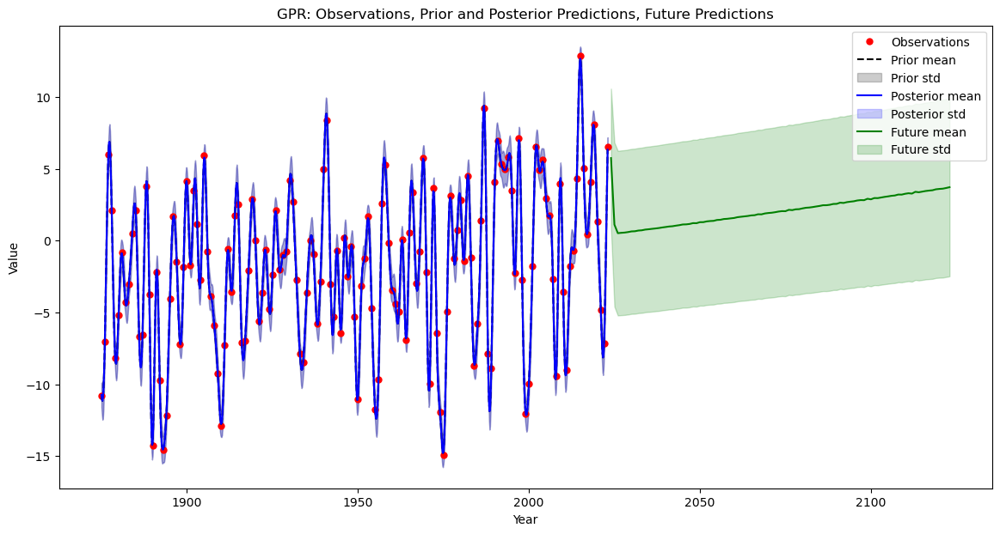

In [57]:
def gp_target(c1, c2, ls1, per1, ls2, per2, ls3, per3, noise):
    kernel = (
        C(c1) * (DotProduct() ** 2) +
        C(c2) * ExpSineSquared(length_scale=ls1, periodicity=per1) +
        C(c2) * ExpSineSquared(length_scale=ls2, periodicity=per2) +
        C(c2) * ExpSineSquared(length_scale=ls3, periodicity=per3) +
        WhiteKernel(noise_level=noise)
    )
    gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
    gp.fit(X, y)
    lml = gp.log_marginal_likelihood()
    return lml


pbounds = {
    'c1': (1e-1, 1e1),
    'c2': (1e-1, 1e1),
    'ls1': (1e-2, 1e1),
    'per1': (1.0, 5.0),
    'ls2': (1e-2, 1e1),
    'per2': (1.0, 5.0),
    'ls3': (1e-2, 1e1),
    'per3': (1.0, 5.0),
    'noise': (1e-3, 1e1),
}

optimizer = BayesianOptimization(
    f=gp_target,
    pbounds=pbounds,
    random_state=42
)


init_points = 10
n_iter = 40

with tqdm(total=init_points + n_iter, desc="Optimization Progress") as pbar:
    optimizer.maximize(init_points=init_points, n_iter=n_iter)
    pbar.update(init_points + n_iter)


best_params = optimizer.max['params']
print("Best parameters found: ", best_params)


kernel = (
    C(best_params['c1']) * (DotProduct() ** 2) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) +
    WhiteKernel(noise_level=best_params['noise'])
)
gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
gp.fit(X, y)


from sklearn.metrics import mean_squared_error

y_pred_train, y_std_train = gp.predict(X, return_std=True)
mse = mean_squared_error(y, y_pred_train)
print(f"Log Marginal Likelihood: {gp.log_marginal_likelihood()}")
print(f"Mean Squared Error: {mse}")


plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
X_plot = np.linspace(X.min(), X.max(), 1000).reshape(-1, 1)
y_pred_prior, y_std_prior = gp.predict(X_plot, return_std=True)
plt.plot(X_plot, y_pred_prior, 'k--', label='Prior mean')
plt.fill_between(X_plot.ravel(), y_pred_prior - y_std_prior, y_pred_prior + y_std_prior, alpha=0.2, color='k', label='Prior std')

y_pred_post, y_std_post = gp.predict(X_plot, return_std=True)
plt.plot(X_plot, y_pred_post, 'b-', label='Posterior mean')
plt.fill_between(X_plot.ravel(), y_pred_post - y_std_post, y_pred_post + y_std_post, alpha=0.2, color='b', label='Posterior std')

X_future = np.arange(X.max() + 1, X.max() + 101).reshape(-1, 1)
y_pred_future, y_std_future = gp.predict(X_future, return_std=True)
plt.plot(X_future, y_pred_future, 'g-', label='Future mean')
plt.fill_between(X_future.ravel(), y_pred_future - y_std_future, y_pred_future + y_std_future, alpha=0.2, color='g', label='Future std')

plt.title('GPR: Observations, Prior and Posterior Predictions, Future Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


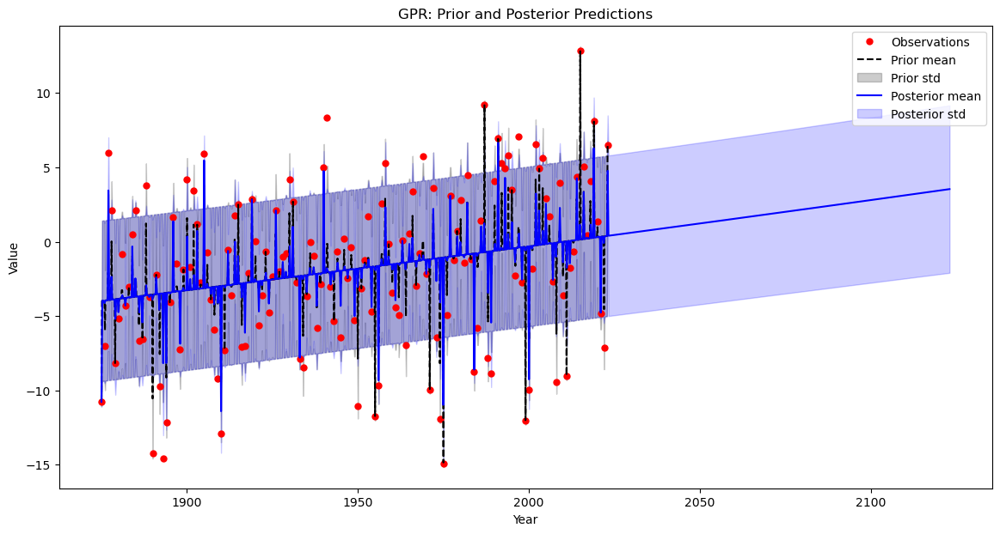

In [78]:
# Create a simplified plot without future predictions, focusing on prior and posterior means with their standard deviations

plt.figure(figsize=(14, 7))

# Observations
plt.plot(X, y, 'r.', markersize=10, label='Observations')

# Prior mean and 1 standard deviation
plt.plot(X_plot, y_pred_prior, 'k--', label='Prior mean')
plt.fill_between(X_plot.ravel(), y_pred_prior - y_std_prior, y_pred_prior + y_std_prior, alpha=0.2, color='k', label='Prior std')

# Posterior mean and 1 standard deviation for the entire time length including the next 100 years
X_extended = np.linspace(X.min(), X.max() + 100, 1100).reshape(-1, 1)
y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)
plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')

# Add titles and legends
plt.title('GPR: Prior and Posterior Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


### 3 periods(2-4,4-8,9-12)

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c1     |    c2     |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |
-------------------------------------------------------------------------------------------------------------------------------------


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 1         | -455.6    | 3.808     | 9.512     | 7.323     | 5.991     | 1.569     | 1.561     | 2.116     | 7.465     | 10.8      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 2         | -461.3    | 7.11      | 0.3038    | 9.699     | 8.326     | 2.131     | 1.819     | 2.367     | 5.217     | 10.57     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 3         | -475.2    | 4.376     | 2.983     | 6.122     | 1.404     | 2.929     | 3.664     | 2.912     | 7.141     | 9.599     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 4         | -471.9    | 5.191     | 5.965     | 0.474     | 6.079     | 1.714     | 0.6515    | 3.898     | 7.863     | 11.43     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 5         | -455.6    | 3.116     | 1.067     | 6.845     | 4.407     | 1.229     | 4.952     | 2.069     | 7.637     | 9.776     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 6         | -471.9    | 6.659     | 3.186     | 5.205     | 5.472     | 1.857     | 9.696     | 3.55      | 7.758     | 11.68     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 7         | -471.1    | 6.019     | 9.227     | 0.894     | 1.968     | 0.4618    | 3.254     | 2.777     | 5.085     | 11.49     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 8         | -455.9    | 3.632     | 2.881     | 5.432     | 1.418     | 8.024     | 0.7464    | 3.974     | 7.089     | 9.596     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 9         | -455.6    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.717     | 4.463     | 11.59     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 10        | -471.9    | 6.271     | 3.376     | 0.6449    | 3.117     | 3.259     | 7.296     | 3.275     | 7.549     | 10.42     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 11        | -467.1    | 0.1775    | 8.196     | 7.094     | 7.316     | 7.738     | 0.7642    | 2.74      | 4.486     | 11.61     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(

| 12        | -470.9    | 5.903     | 7.005     | 8.549     | 7.905     | 4.717     | 3.86      | 2.79      | 5.949     | 11.16     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 13        | -455.6    | 1.953     | 6.374     | 9.945     | 0.9425    | 8.001     | 3.682     | 3.213     | 6.496     | 9.232     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 14        | -471.2    | 6.181     | 2.916     | 8.242     | 9.2       | 8.963     | 8.192     | 3.362     | 7.705     | 10.45     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(

| 15        | -470.2    | 0.5581    | 7.922     | 8.178     | 1.19      | 5.669     | 5.769     | 2.446     | 4.929     | 9.19      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(

| 16        | -471.9    | 3.315     | 1.701     | 9.693     | 6.988     | 3.635     | 0.6581    | 2.196     | 7.241     | 9.453     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 17        | -457.2    | 3.136     | 7.863     | 0.05659   | 2.694     | 9.29      | 1.405     | 2.39      | 4.347     | 9.883     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 18        | -467.5    | 9.131     | 2.434     | 5.677     | 3.849     | 5.059     | 7.088     | 3.213     | 4.111     | 10.67     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 19        | -471.2    | 2.856     | 0.3552    | 3.378     | 4.565     | 4.811     | 6.974     | 3.567     | 7.673     | 10.68     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 20        | -471.9    | 7.691     | 8.714     | 9.527     | 9.544     | 7.925     | 1.099     | 2.031     | 7.324     | 10.12     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.w

| 21        | -468.7    | 4.807     | 0.221     | 9.469     | 1.526     | 8.426     | 8.51      | 2.042     | 4.283     | 10.36     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 22        | -471.9    | 6.087     | 8.873     | 0.795     | 5.24      | 6.395     | 2.755     | 2.202     | 5.211     | 11.25     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 23        | -471.9    | 1.127     | 3.572     | 8.337     | 7.701     | 4.784     | 6.953     | 3.084     | 7.239     | 9.398     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 24        | -463.2    | 4.93      | 2.265     | 6.722     | 8.411     | 0.925     | 3.127     | 3.6       | 5.072     | 10.5      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 25        | -472.2    | 0.5616    | 5.594     | 7.499     | 4.229     | 7.82      | 7.188     | 3.083     | 7.246     | 10.64     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 26        | -471.9    | 0.8445    | 6.982     | 5.789     | 4.427     | 3.14      | 5.466     | 2.894     | 6.536     | 9.715     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 27        | -471.9    | 9.028     | 5.66      | 8.982     | 4.145     | 9.602     | 6.505     | 2.332     | 4.161     | 11.23     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 28        | -469.8    | 5.609     | 5.229     | 1.364     | 9.125     | 1.103     | 8.035     | 3.988     | 4.56      | 11.07     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 29        | -472.0    | 2.685     | 4.423     | 9.84      | 5.206     | 6.954     | 0.5711    | 2.281     | 5.279     | 9.153     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
Optimization Progress: 100%|██████████| 30/30 [03:01<00:00,  6.06s/it]


| 30        | -465.6    | 2.184     | 4.545     | 8.947     | 6.781     | 2.793     | 4.163     | 2.719     | 7.471     | 10.59     |
Best parameters found:  {'c1': 0.15466895952366377, 'c2': 8.173068141702858, 'ls1': 7.071504865037695, 'ls2': 7.292781608729463, 'ls3': 7.714990763392598, 'noise': 0.7413724726891696, 'per1': 2.7169314570885454, 'per2': 4.463476238100519, 'per3': 11.58931027762678}


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


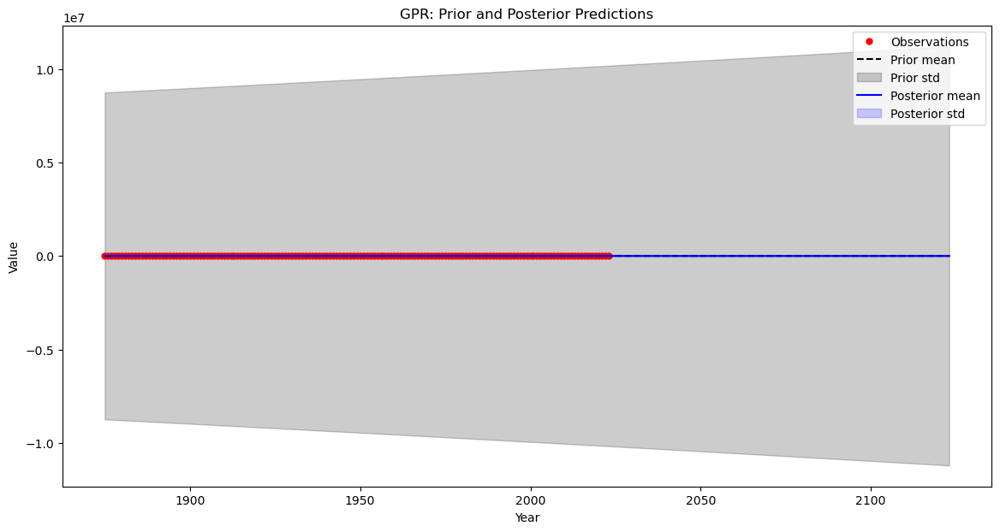

In [83]:
def gp_target(c1, c2, ls1, per1, ls2, per2, ls3, per3, noise):
    kernel = (
        C(c1) * (DotProduct() ** 2) +
        C(c2) * ExpSineSquared(length_scale=ls1, periodicity=per1) +
        C(c2) * ExpSineSquared(length_scale=ls2, periodicity=per2) +
        C(c2) * ExpSineSquared(length_scale=ls3, periodicity=per3) +
        WhiteKernel(noise_level=noise)
    )
    gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
    gp.fit(X, y)
    lml = gp.log_marginal_likelihood()
    return lml

pbounds = {
    'c1': (1e-1, 1e1),
    'c2': (1e-1, 1e1),
    'ls1': (1e-2, 1e1),
    'per1': (2.0, 4.0),
    'ls2': (1e-2, 1e1),
    'per2': (4.0, 8.0),
    'ls3': (1e-2, 1e1),
    'per3': (9.0, 12.0),
    'noise': (1e-3, 1e1),
}

optimizer = BayesianOptimization(
    f=gp_target,
    pbounds=pbounds,
    random_state=42
)

init_points = 10
n_iter = 20

with tqdm(total=init_points + n_iter, desc="Optimization Progress") as pbar:
    optimizer.maximize(init_points=init_points, n_iter=n_iter)
    pbar.update(init_points + n_iter)

best_params = optimizer.max['params']
print("Best parameters found: ", best_params)

kernel = (
    C(best_params['c1']) * (DotProduct() ** 2) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) +
    WhiteKernel(noise_level=best_params['noise'])
)

gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)

X_extended = np.linspace(X.min(), X.max() + 100, 1100).reshape(-1, 1)
K = kernel(X_extended)  
prior_mean = np.zeros(X_extended.shape[0])
prior_std = np.sqrt(np.diag(K))
gp.fit(X, y)
y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)

plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')

plt.plot(X_extended, y_pred_prior, 'k--', label='Prior mean')
plt.fill_between(X_extended.ravel(), y_pred_prior - y_std_prior, y_pred_prior + y_std_prior, alpha=0.2, color='k', label='Prior std')

plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')

plt.title('GPR: Prior and Posterior Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


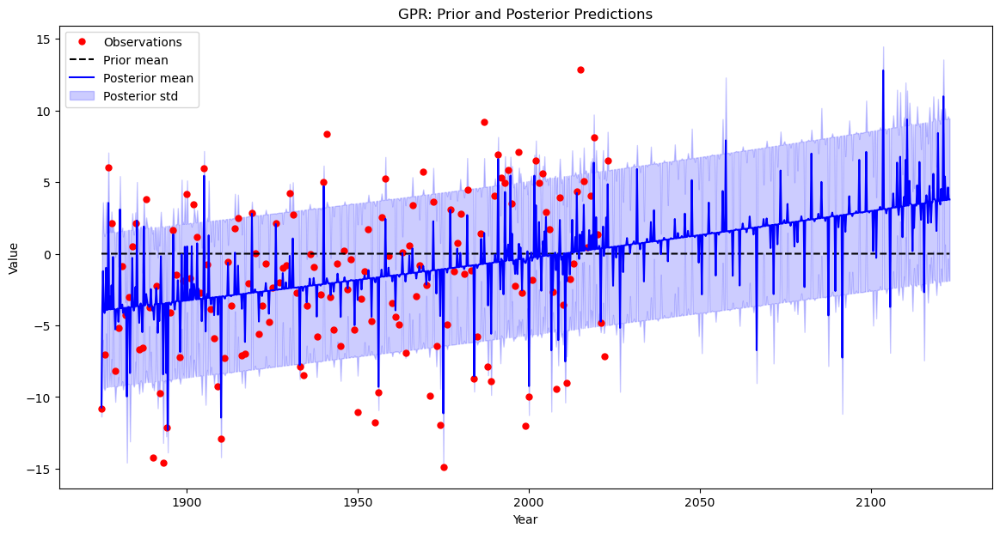

In [84]:
X_extended = np.linspace(X.min(), X.max() + 100, 1100).reshape(-1, 1)
K = kernel(X_extended)
prior_mean = np.zeros(X_extended.shape[0])
prior_std = np.sqrt(np.diag(K))
gp.fit(X, y)
y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)

plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X_extended, y_pred_prior, 'k--', label='Prior mean')
# plt.fill_between(X_extended.ravel(), y_pred_prior - y_std_prior, y_pred_prior + y_std_prior, alpha=0.2, color='k', label='Prior std')
plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')
plt.title('GPR: Prior and Posterior Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


In [92]:
best_params

{'c1': 0.15466895952366377,
 'c2': 8.173068141702858,
 'ls1': 7.071504865037695,
 'ls2': 7.292781608729463,
 'ls3': 7.714990763392598,
 'noise': 0.7413724726891696,
 'per1': 2.7169314570885454,
 'per2': 4.463476238100519,
 'per3': 11.58931027762678}

d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


-471.851542583007


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


<Figure size 1400x700 with 0 Axes>

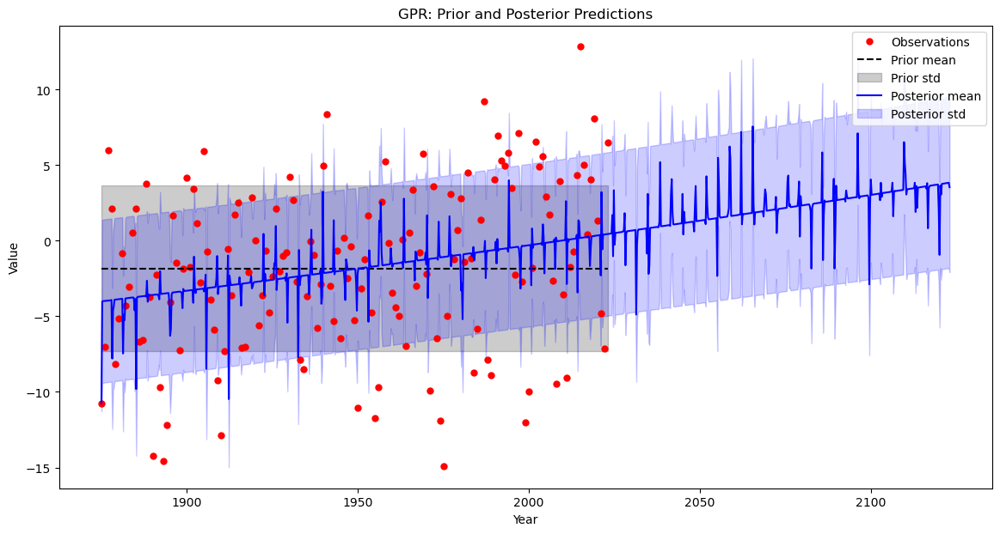

In [113]:
kernel = (
    C(best_params['c1']) * (DotProduct() ** 2) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) +
    WhiteKernel(noise_level=best_params['noise'])
)
gp = GaussianProcessRegressor(kernel=kernel, alpha=0, n_restarts_optimizer=10)

# Calculate the prior mean and standard deviation directly from the original data
prior_mean_value = np.mean(y)
prior_std_value = np.std(y)

# Extend the prior mean and std to match the length of X for plotting
prior_mean = np.full(X.shape[0], prior_mean_value)
prior_std = np.full(X.shape[0], prior_std_value)

gp.fit(X, y)
# Calculate and print the log marginal likelihood
log_marginal_likelihood = gp.log_marginal_likelihood()
print(log_marginal_likelihood)
y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)

plt.figure(figsize=(14, 7))
# Plot prior mean and standard deviation
plt.figure(figsize=(14, 7))

# Observations
plt.plot(X, y, 'r.', markersize=10, label='Observations')

# Prior mean and 1 standard deviation based on original data
plt.plot(X, prior_mean, 'k--', label='Prior mean')
plt.fill_between(X.ravel(), prior_mean - prior_std, prior_mean + prior_std, alpha=0.2, color='k', label='Prior std')

plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')
plt.title('GPR: Prior and Posterior Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


In [99]:
prior_std_value = np.std(y)
prior_std_value

5.485437325923712

d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


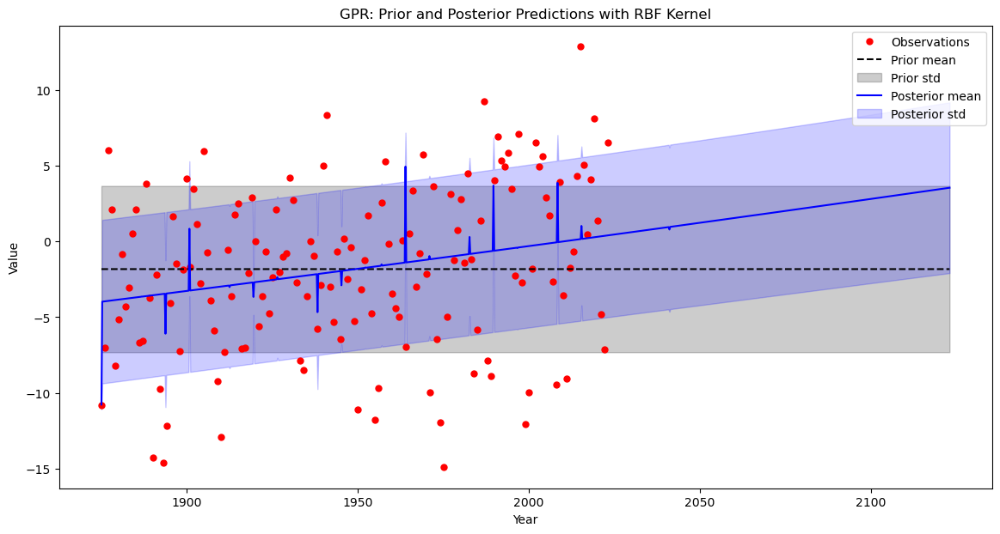

In [86]:
gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
gp.fit(X, y)

# Calculate the prior mean and standard deviation directly from the original data
prior_mean_value = np.mean(y)
prior_std_value = np.std(y)

# Extend the prior mean and std to match the length of X_extended for plotting
prior_mean = np.full(X_extended.shape[0], prior_mean_value)
prior_std = np.full(X_extended.shape[0], prior_std_value)

# Calculate posterior mean and standard deviation
y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)

# Plot prior and posterior mean and standard deviation
plt.figure(figsize=(14, 7))

# Observations
plt.plot(X, y, 'r.', markersize=10, label='Observations')

# Prior mean and 1 standard deviation
plt.plot(X_extended, prior_mean, 'k--', label='Prior mean')
plt.fill_between(X_extended.ravel(), prior_mean - prior_std, prior_mean + prior_std, alpha=0.2, color='k', label='Prior std')

# Posterior mean and 1 standard deviation
plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')

# Add title and legend
plt.title('GPR: Prior and Posterior Predictions with RBF Kernel')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()

This is a repeating optimization. We can see with this method(n_restarts_optimizer, alpha...), the result is unstable.

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c1     |    c2     |    c3     |    c4     |    c5     | dp_sig... |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  w

| 1         | -455.6    | 3.808     | 9.512     | 7.347     | 6.027     | 1.645     | 1.561     | 0.5903    | 8.663     | 6.015     | 7.081     | 2.041     | 7.88      | 11.5      | 21.24     | 1.826     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 2         | -470.5    | 1.916     | 3.112     | 5.295     | 4.376     | 2.983     | 6.119     | 1.404     | 2.929     | 3.67      | 4.561     | 3.57      | 4.799     | 10.54     | 59.25     | 0.474     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 3         | -471.9    | 6.115     | 1.788     | 0.744     | 9.494     | 9.66      | 8.084     | 3.053     | 0.9857    | 6.845     | 4.402     | 2.244     | 5.981     | 9.103     | 90.93     | 2.595     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 4         | -472.0    | 6.659     | 3.186     | 5.249     | 5.512     | 1.93      | 9.696     | 7.754     | 9.396     | 8.949     | 5.979     | 3.844     | 4.354     | 9.588     | 4.532     | 3.26      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__kernel__sigma_0 is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.

| 5         | -455.6    | 3.948     | 2.786     | 8.305     | 3.632     | 2.881     | 5.427     | 1.418     | 8.024     | 0.7548    | 9.869     | 3.544     | 4.795     | 9.017     | 81.55     | 7.072     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 6         | -455.3    | 7.317     | 7.736     | 0.833     | 3.649     | 1.247     | 8.631     | 6.237     | 3.316     | 0.6449    | 3.111     | 2.65      | 6.918     | 10.91     | 88.72     | 4.727     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 7         | -474.7    | 1.284     | 7.161     | 7.632     | 5.657     | 7.733     | 4.938     | 5.232     | 4.281     | 0.2639    | 1.08      | 2.063     | 6.546     | 9.943     | 50.86     | 9.077     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 8         | -471.9    | 2.568     | 4.163     | 7.58      | 2.365     | 0.8621    | 2.898     | 1.621     | 9.298     | 8.083     | 6.334     | 3.743     | 7.215     | 9.56      | 89.26     | 5.398     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 9         | -455.6    | 8.094     | 8.971     | 3.248     | 1.19      | 2.357     | 4.272     | 8.182     | 8.609     | 0.07945   | 5.108     | 2.835     | 4.888     | 9.36      | 33.77     | 9.43      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 10        | -471.9    | 3.3       | 5.236     | 7.06      | 3.7       | 9.721     | 9.625     | 2.525     | 4.978     | 3.016     | 2.849     | 2.074     | 6.438     | 10.51     | 5.157     | 2.794     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 11        | -467.4    | 7.334     | 7.752     | 0.8497    | 3.666     | 1.264     | 8.648     | 6.254     | 3.332     | 0.6616    | 3.127     | 2.667     | 6.935     | 10.93     | 88.74     | 4.744     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 12        | -471.9    | 2.0       | 9.593     | 7.582     | 4.533     | 4.973     | 3.202     | 8.901     | 6.507     | 7.947     | 0.5157    | 2.232     | 6.506     | 9.065     | 87.53     | 6.32      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 13        | -471.9    | 8.806     | 7.668     | 9.087     | 4.937     | 0.3979    | 8.319     | 5.326     | 0.4407    | 0.063     | 2.171     | 2.673     | 6.055     | 10.65     | 83.51     | 2.562     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnin

| 14        | -455.6    | 5.124     | 4.785     | 5.094     | 6.898     | 1.328     | 3.241     | 8.824     | 1.973     | 1.143     | 6.273     | 2.316     | 5.435     | 10.37     | 48.46     | 0.3785    |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 15        | -454.8    | 0.6719    | 5.829     | 9.265     | 2.646     | 6.145     | 2.439     | 6.425     | 3.967     | 2.19      | 5.834     | 2.672     | 7.283     | 11.97     | 10.77     | 0.5654    |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 16        | -455.6    | 0.8132    | 1.213     | 9.262     | 1.198     | 1.089     | 3.565     | 7.337     | 9.323     | 5.33      | 8.238     | 2.395     | 5.311     | 11.83     | 45.88     | 4.192     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 17        | -455.6    | 7.09      | 8.187     | 6.567     | 5.788     | 4.355     | 7.69      | 7.917     | 4.43      | 9.041     | 4.244     | 2.584     | 5.728     | 10.81     | 64.02     | 7.917     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 18        | -465.9    | 8.278     | 3.391     | 1.537     | 3.831     | 0.2934    | 9.943     | 4.93      | 6.074     | 0.8823    | 5.675     | 3.512     | 4.564     | 11.61     | 74.61     | 8.187     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d

| 19        | -455.1    | 3.019     | 6.94      | 5.934     | 9.291     | 4.914     | 4.902     | 4.923     | 4.567     | 2.64      | 7.197     | 3.484     | 6.156     | 9.691     | 67.29     | 0.03671   |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 20        | -455.6    | 7.251     | 1.108     | 1.537     | 1.528     | 2.955     | 7.569     | 8.271     | 6.637     | 8.532     | 2.307     | 3.444     | 7.79      | 11.3      | 43.86     | 5.527     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 21        | -453.6    | 1.073     | 7.07      | 0.504     | 1.861     | 5.9       | 0.5636    | 9.929     | 0.03823   | 3.197     | 3.205     | 2.55      | 6.604     | 10.37     | 35.5      | 7.265     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 22        | -453.5    | 1.524     | 4.233     | 1.64      | 4.032     | 5.371     | 3.047     | 8.034     | 8.328     | 9.946     | 2.559     | 2.793     | 7.399     | 11.95     | 96.93     | 8.391     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 23        | -471.9    | 4.15      | 3.596     | 8.066     | 8.163     | 3.696     | 5.882     | 3.985     | 6.44      | 5.47      | 9.647     | 3.765     | 7.07      | 10.11     | 85.15     | 8.438     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 24        | -452.4    | 0.6236    | 1.911     | 1.138     | 6.286     | 2.35      | 9.882     | 5.628     | 0.9804    | 1.286     | 1.285     | 2.919     | 4.507     | 10.45     | 29.16     | 2.999     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 25        | -455.6    | 4.585     | 9.722     | 3.516     | 1.965     | 3.658     | 3.148     | 1.23      | 2.16      | 5.617     | 2.335     | 2.792     | 5.162     | 9.506     | 22.23     | 5.121     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 26        | -471.9    | 8.251     | 5.104     | 3.604     | 8.792     | 1.051     | 4.797     | 9.418     | 9.785     | 8.993     | 2.696     | 2.801     | 5.063     | 11.48     | 98.66     | 5.545     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 27        | -455.6    | 9.913     | 4.37      | 7.73      | 2.537     | 9.006     | 1.426     | 4.308     | 3.699     | 6.413     | 8.448     | 2.064     | 5.638     | 9.383     | 34.97     | 7.861     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  wa

| 28        | -455.6    | 5.235     | 1.472     | 9.911     | 7.581     | 9.564     | 4.349     | 2.367     | 5.453     | 4.234     | 6.946     | 3.397     | 5.244     | 9.019     | 99.65     | 1.665     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 29        | -458.0    | 7.829     | 4.834     | 4.587     | 4.848     | 0.9911    | 6.415     | 4.354     | 5.931     | 9.183     | 2.133     | 2.488     | 6.631     | 11.31     | 21.32     | 5.976     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
Optimi

| 30        | -455.6    | 1.643     | 1.399     | 5.83      | 9.685     | 0.4147    | 5.387     | 7.72      | 4.669     | 5.78      | 5.053     | 2.277     | 7.693     | 11.07     | 83.99     | 5.904     |
Best parameters found:  {'c1': 0.6235979899729001, 'c2': 1.9111851506273214, 'c3': 1.138392968245064, 'c4': 6.285635721624933, 'c5': 2.349949514547424, 'dp_sigma_0': 9.881971534117463, 'ls1': 5.627770018550201, 'ls2': 0.98043773353102, 'ls3': 1.286025428719742, 'noise': 1.2848421745297745, 'per1': 2.918680608297211, 'per2': 4.507174383386891, 'per3': 10.447341356063486, 'rq_alpha': 29.161088301470407, 'rq_ls': 2.9990738764475178}


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


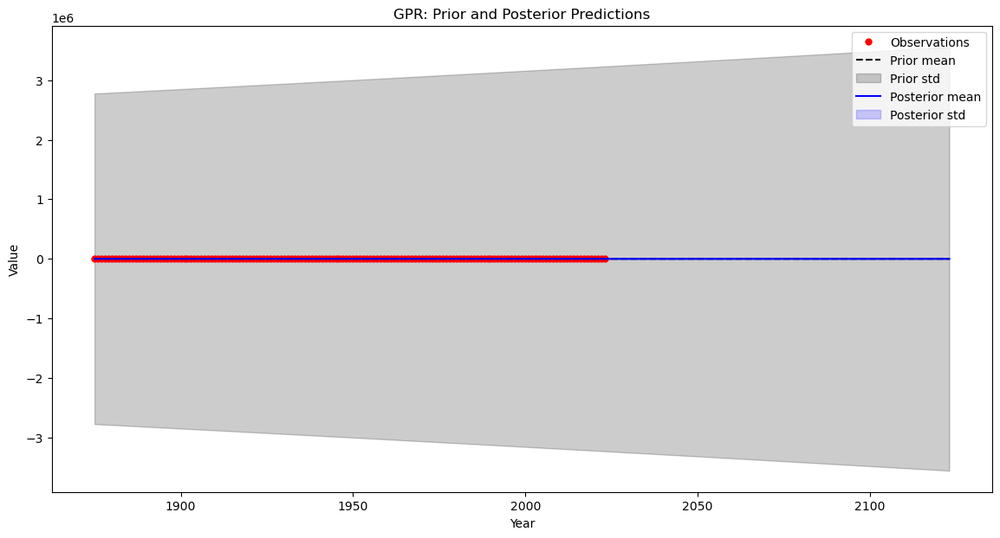

In [115]:
def gp_target(c1, c2, c3, c4, c5, ls1, per1, ls2, per2, ls3, per3, noise, dp_sigma_0, rq_alpha, rq_ls):
    kernel = (
        C(c1) * (DotProduct(sigma_0=dp_sigma_0) ** 2) +
        C(c2) * ExpSineSquared(length_scale=ls1, periodicity=per1) +
        C(c3) * ExpSineSquared(length_scale=ls2, periodicity=per2) +
        C(c4) * ExpSineSquared(length_scale=ls3, periodicity=per3) +
        C(c5) * RationalQuadratic(length_scale=rq_ls, alpha=rq_alpha) +
        WhiteKernel(noise_level=noise)
    )
    gp = GaussianProcessRegressor(kernel=kernel, alpha=0, n_restarts_optimizer=10)
    gp.fit(X, y)
    lml = gp.log_marginal_likelihood()
    return lml

pbounds = {
    'c1': (1e-1, 1e1),
    'c2': (1e-1, 1e1),
    'c3': (1e-1, 1e1),
    'c4': (1e-1, 1e1),
    'c5': (1e-1, 1e1),
    'ls1': (1e-2, 1e1),
    'per1': (2.0, 4.0),
    'ls2': (1e-2, 1e1),
    'per2': (4.0, 8.0),
    'ls3': (1e-2, 1e1),
    'per3': (9.0, 12.0),
    'noise': (1e-3, 1e1),
    'dp_sigma_0': (1e-3, 1e1),
    'rq_alpha': (1e-2, 1e2),
    'rq_ls': (1e-2, 1e1),
}

optimizer = BayesianOptimization(
    f=gp_target,
    pbounds=pbounds,
    random_state=42
)

init_points = 10
n_iter = 20

with tqdm(total=init_points + n_iter, desc="Optimization Progress") as pbar:
    optimizer.maximize(init_points=init_points, n_iter=n_iter)
    pbar.update(init_points + n_iter)

best_params = optimizer.max['params']
print("Best parameters found: ", best_params)

kernel = (
    C(best_params['c1']) * (DotProduct(sigma_0=best_params['dp_sigma_0']) ** 2) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) +
    C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) +
    C(best_params['c5']) * RationalQuadratic(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
    WhiteKernel(noise_level=best_params['noise'])
)
gp = GaussianProcessRegressor(kernel=kernel, alpha=0, n_restarts_optimizer=10)
X_extended = np.linspace(X.min(), X.max() + 100, 1100).reshape(-1, 1)
K = kernel(X_extended)
prior_mean = np.zeros(X_extended.shape[0]) 
prior_std = np.sqrt(np.diag(K)) 
gp.fit(X, y)
y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)

plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X_extended, prior_mean, 'k--', label='Prior mean')
plt.fill_between(X_extended.ravel(), prior_mean - prior_std, prior_mean + prior_std, alpha=0.2, color='k', label='Prior std')
plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')
plt.title('GPR: Prior and Posterior Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


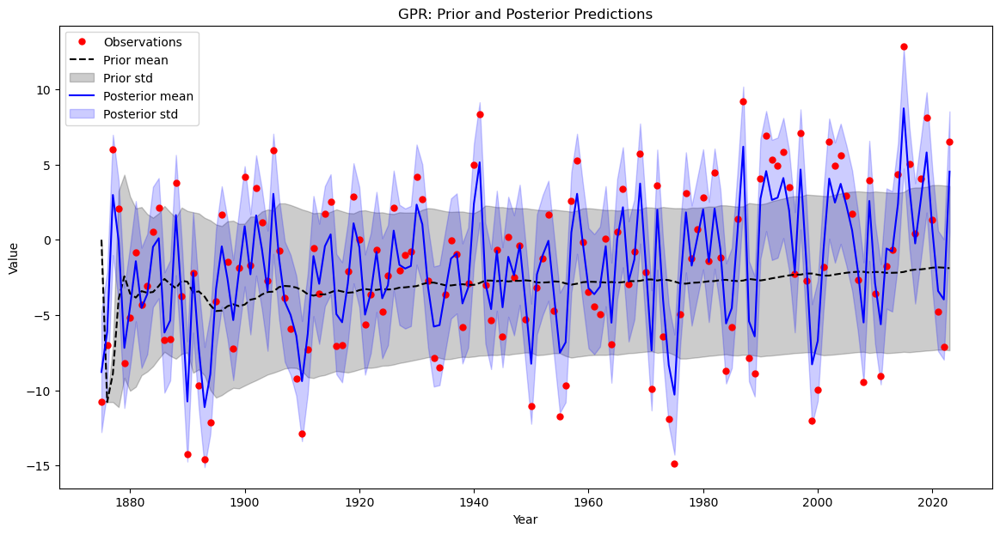

In [131]:
mean_list = []
std_list = []

for i in range(len(y)):
    if i == 0:
        # For the first data point, we don't have any previous data points to calculate mean and std
        mean_list.append(0)
        std_list.append(0)
    else:
        # Calculate mean and std for the previous data points
        mean_list.append(y[:i].mean())
        std_list.append(y[:i].std())

mean_array = np.array(mean_list)
std_array = np.array(std_list)

plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X, mean_array, 'k--', label='Prior mean')
plt.fill_between(X.ravel(), mean_array - std_array, mean_array + std_array, alpha=0.2, color='k', label='Prior std')
plt.plot(X, y_pred_post, 'b-', label='Posterior mean')
plt.fill_between(X.ravel(), y_pred_post - y_std_post, y_pred_post + y_std_post, alpha=0.2, color='b', label='Posterior std')
plt.title('GPR: Prior and Posterior Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


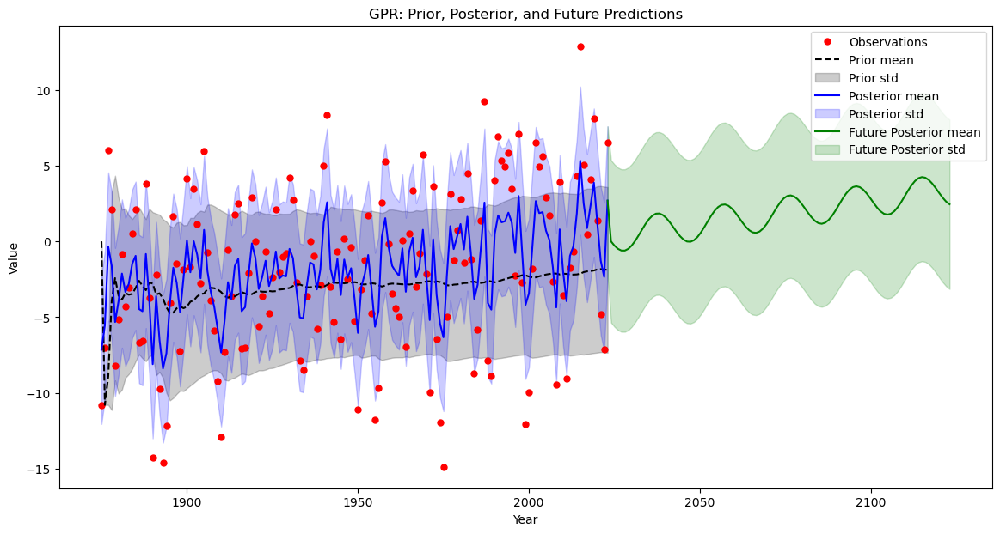

In [135]:
gp = GaussianProcessRegressor(kernel=kernel, alpha=0, n_restarts_optimizer=10)
gp.fit(X, y)
y_pred_post, y_std_post = gp.predict(X, return_std=True)

mean_list = []
std_list = []

for i in range(len(y)):
    if i == 0:
        # For the first data point, we don't have any previous data points to calculate mean and std
        mean_list.append(0)
        std_list.append(0)
    else:
        # Calculate mean and std for the previous data points
        mean_list.append(y[:i].mean())
        std_list.append(y[:i].std())

mean_array = np.array(mean_list)
std_array = np.array(std_list)
X_future = np.linspace(X.max(), X.max() + 100, 100).reshape(-1, 1)
y_pred_future, y_std_future = gp.predict(X_future, return_std=True)
plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')

plt.plot(X, mean_array, 'k--', label='Prior mean')
plt.fill_between(X.ravel(), mean_array - std_array, mean_array + std_array, alpha=0.2, color='k', label='Prior std')
plt.plot(X, y_pred_post, 'b-', label='Posterior mean')
plt.fill_between(X.ravel(), y_pred_post - y_std_post, y_pred_post + y_std_post, alpha=0.2, color='b', label='Posterior std')
plt.plot(X_future, y_pred_future, 'g-', label='Future Posterior mean')
plt.fill_between(X_future.ravel(), y_pred_future - y_std_future, y_pred_future + y_std_future, alpha=0.2, color='g', label='Future Posterior std')
plt.title('GPR: Prior, Posterior, and Future Predictions')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c1     |    c2     |    c3     |    c4     |    c5     | dp_sig... |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |   rbf_c   |  rbf_ls   | rq_alpha1 | rq_alpha2 | rq_alpha3 |  rq_ls1   |  rq_ls2   |  rq_ls3   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPse

| 1         | -455.5    | 3.808     | 9.512     | 7.347     | 6.027     | 1.645     | 1.561     | 0.5903    | 8.663     | 6.015     | 7.081     | 2.041     | 7.88      | 11.5      | 2.202     | 1.826     | 18.35     | 30.43     | 52.48     | 4.325     | 2.919     | 6.122     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a be

| 2         | -455.5    | 1.481     | 2.992     | 3.727     | 4.615     | 7.873     | 1.998     | 5.147     | 5.928     | 0.474     | 6.076     | 2.341     | 4.26      | 11.85     | 9.66      | 8.086     | 30.47     | 9.776     | 68.43     | 4.407     | 1.229     | 4.957     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 3         | -455.5    | 0.4404    | 9.102     | 2.662     | 6.659     | 3.186     | 5.201     | 5.472     | 1.857     | 9.696     | 7.752     | 3.879     | 7.579     | 10.79     | 9.227     | 0.894     | 19.61     | 4.532     | 32.54     | 3.893     | 2.721     | 8.289     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\env

| 4         | -455.5    | 3.632     | 2.881     | 5.473     | 1.495     | 8.042     | 0.7464    | 9.869     | 7.725     | 1.995     | 0.05622   | 3.631     | 6.827     | 11.19     | 7.736     | 0.7497    | 35.85     | 11.6      | 86.31     | 6.237     | 3.316     | 0.6449    |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 5         | -455.5    | 3.179     | 3.319     | 7.323     | 6.412     | 8.883     | 4.723     | 1.205     | 7.135     | 7.61      | 5.613     | 3.542     | 5.975     | 10.57     | 4.333     | 0.2639    | 10.8      | 3.153     | 63.64     | 3.15      | 5.091     | 9.077     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  

| 6         | -455.5    | 2.568     | 4.163     | 7.58      | 2.365     | 0.8621    | 2.898     | 1.621     | 9.298     | 8.083     | 6.334     | 3.743     | 7.215     | 9.56      | 8.936     | 5.398     | 80.75     | 89.61     | 31.81     | 1.109     | 2.287     | 4.277     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.

| 7         | -455.5    | 8.198     | 8.621     | 0.1688    | 5.156     | 4.232     | 2.222     | 1.207     | 3.383     | 9.43      | 3.233     | 3.038     | 6.812     | 10.09     | 9.721     | 9.625     | 25.19     | 49.73     | 30.09     | 2.856     | 0.3785    | 6.1       |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 8         | -455.1    | 5.077     | 0.6096    | 2.859     | 9.092     | 2.472     | 1.45      | 4.9       | 9.857     | 2.428     | 6.722     | 3.523     | 4.951     | 11.18     | 3.741     | 6.327     | 63.36     | 53.58     | 9.038     | 8.355     | 3.215     | 1.873     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better v

| 9         | -455.5    | 0.5037    | 5.95      | 6.808     | 0.2642    | 5.17      | 2.266     | 6.455     | 1.752     | 6.912     | 3.868     | 3.873     | 4.55      | 10.02     | 1.223     | 9.248     | 87.74     | 25.8      | 66.0      | 8.174     | 5.556     | 5.301     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better

| 10        | -453.1    | 2.494     | 1.022     | 8.982     | 9.014     | 6.368     | 3.391     | 3.499     | 7.262     | 8.972     | 8.871     | 3.56      | 6.568     | 9.252     | 1.7       | 8.987     | 60.65     | 0.9296    | 10.16     | 6.638     | 0.06057   | 1.616     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 11        | -457.5    | 2.346     | 0.1       | 10.0      | 10.0      | 10.0      | 4.052     | 0.4658    | 10.0      | 10.0      | 10.0      | 3.334     | 7.592     | 9.0       | 0.1       | 10.0      | 76.62     | 0.01      | 0.01      | 7.452     | 0.01      | 0.01      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better

| 12        | -452.2    | 2.658     | 1.185     | 9.146     | 9.178     | 6.531     | 3.555     | 3.662     | 7.426     | 9.136     | 9.035     | 3.723     | 6.732     | 9.416     | 1.864     | 9.15      | 60.81     | 0.9296    | 10.32     | 6.802     | 0.1424    | 1.78      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 13        | -455.4    | 2.839     | 1.366     | 9.323     | 9.355     | 6.708     | 3.735     | 3.839     | 7.603     | 9.313     | 9.212     | 2.844     | 6.909     | 9.593     | 2.044     | 9.327     | 60.98     | 0.935     | 10.5      | 6.979     | 0.2344    | 1.961     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.war

| 14        | -455.5    | 2.485     | 1.013     | 9.137     | 9.169     | 6.522     | 3.382     | 3.653     | 7.418     | 9.127     | 9.025     | 4.0       | 6.725     | 9.407     | 1.694     | 9.141     | 60.91     | 0.6924    | 10.31     | 6.794     | 0.0118    | 1.608     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  wa

| 15        | -452.6    | 2.658     | 1.185     | 9.146     | 9.178     | 6.531     | 3.555     | 3.662     | 7.426     | 9.136     | 9.035     | 3.723     | 6.732     | 9.416     | 1.864     | 9.15      | 60.81     | 0.9296    | 10.32     | 6.802     | 0.1424    | 1.78      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 16        | -455.5    | 1.705     | 3.394     | 6.984     | 4.441     | 9.25      | 3.85      | 6.759     | 0.5135    | 7.307     | 3.389     | 2.085     | 7.899     | 11.96     | 0.6639    | 0.4929    | 19.21     | 55.36     | 23.08     | 6.748     | 6.984     | 8.129     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  

| 17        | -455.5    | 2.591     | 4.335     | 4.36      | 1.571     | 3.261     | 3.541     | 1.361     | 6.865     | 4.66      | 0.6297    | 3.309     | 6.835     | 9.218     | 2.262     | 8.102     | 25.71     | 58.12     | 73.1      | 8.065     | 6.121     | 4.182     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 18        | -451.5    | 1.211     | 6.401     | 1.091     | 0.6647    | 8.247     | 2.139     | 9.4       | 5.813     | 5.706     | 7.863     | 3.793     | 4.069     | 9.644     | 3.571     | 6.553     | 78.96     | 53.76     | 18.16     | 2.742     | 7.499     | 3.358     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\

| 19        | -455.5    | 0.9781    | 8.203     | 1.012     | 0.3767    | 9.302     | 2.325     | 2.289     | 2.068     | 6.969     | 0.827     | 2.401     | 5.974     | 11.2      | 6.891     | 4.208     | 3.186     | 8.866     | 94.57     | 1.943     | 4.697     | 2.774     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 20        | -449.0    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.463     | 1.152     | 2.581     | 8.176     | 3.393     | 3.887     | 7.54      | 9.677     | 8.762     | 4.864     | 82.74     | 27.95     | 69.05     | 6.849     | 9.085     | 8.472     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnin

| 21        | -455.5    | 6.304     | 5.48      | 7.18      | 6.215     | 0.3867    | 9.684     | 4.0       | 2.773     | 8.922     | 2.253     | 2.56      | 5.414     | 9.55      | 4.512     | 8.756     | 12.12     | 36.34     | 0.5485    | 2.267     | 8.86      | 0.8362    |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  wa

| 22        | -455.5    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.463     | 1.152     | 2.581     | 8.176     | 3.393     | 3.887     | 7.54      | 9.677     | 8.762     | 4.864     | 82.74     | 27.95     | 69.05     | 6.849     | 9.085     | 8.472     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 23        | -455.5    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.463     | 1.152     | 2.581     | 8.176     | 3.393     | 3.887     | 7.54      | 9.677     | 8.762     | 4.864     | 82.74     | 27.95     | 69.05     | 6.849     | 9.085     | 8.472     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better

| 24        | -455.5    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.463     | 1.152     | 2.581     | 8.176     | 3.393     | 3.887     | 7.54      | 9.677     | 8.762     | 4.864     | 82.74     | 27.95     | 69.05     | 6.849     | 9.085     | 8.472     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better va

| 25        | -454.8    | 2.341     | 7.219     | 1.558     | 6.057     | 9.142     | 6.087     | 4.296     | 7.436     | 2.986     | 5.888     | 3.243     | 6.271     | 9.809     | 6.825     | 3.427     | 8.317     | 47.51     | 35.75     | 1.966     | 4.467     | 7.14      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k2__kernel__sigma_0 is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a bette

| 26        | -457.1    | 7.796     | 7.271     | 2.638     | 0.776     | 3.611     | 4.057     | 0.02274   | 1.175     | 9.593     | 2.217     | 3.942     | 7.548     | 9.028     | 9.137     | 1.583     | 94.2      | 19.08     | 79.51     | 6.843     | 0.05908   | 5.71      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 27        | -457.1    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.463     | 1.152     | 2.581     | 8.176     | 3.393     | 3.887     | 7.54      | 9.677     | 8.762     | 4.864     | 82.74     | 27.95     | 69.05     | 6.849     | 9.085     | 8.472     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 28        | -455.5    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.463     | 1.152     | 2.581     | 8.176     | 3.393     | 3.887     | 7.54      | 9.677     | 8.762     | 4.864     | 82.74     | 27.95     | 69.05     | 6.849     | 9.085     | 8.472     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anac

| 29        | -455.5    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.463     | 1.152     | 2.581     | 8.176     | 3.393     | 3.887     | 7.54      | 9.677     | 8.762     | 4.864     | 82.74     | 27.95     | 69.05     | 6.849     | 9.085     | 8.472     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
Optimization Progress: 100%|██████████| 30/30 [17:24<00:00, 34.82s/it]


| 30        | -455.5    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.463     | 1.152     | 2.581     | 8.176     | 3.393     | 3.887     | 7.54      | 9.677     | 8.762     | 4.864     | 82.74     | 27.95     | 69.05     | 6.849     | 9.085     | 8.472     |
Best parameters found:  {'c1': 3.1722616152730687, 'c2': 6.493663562179368, 'c3': 2.908365502048508, 'c4': 3.9736253182007326, 'c5': 3.2685756033517572, 'dp_sigma_0': 7.46296068458785, 'ls1': 1.1524573481076557, 'ls2': 2.581085367818879, 'ls3': 8.175985094669675, 'noise': 3.393286649647549, 'per1': 3.886637361881473, 'per2': 7.539954429173818, 'per3': 9.67672047172686, 'rbf_c': 8.761955330535823, 'rbf_ls': 4.863981287799867, 'rq_alpha1': 82.74024383508461, 'rq_alpha2': 27.94511699480263, 'rq_alpha3': 69.05415462186366, 'rq_ls1': 6.8486031974343895, 'rq_ls2': 9.085032180163555, 'rq_ls3': 8.472099886402905}


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better va

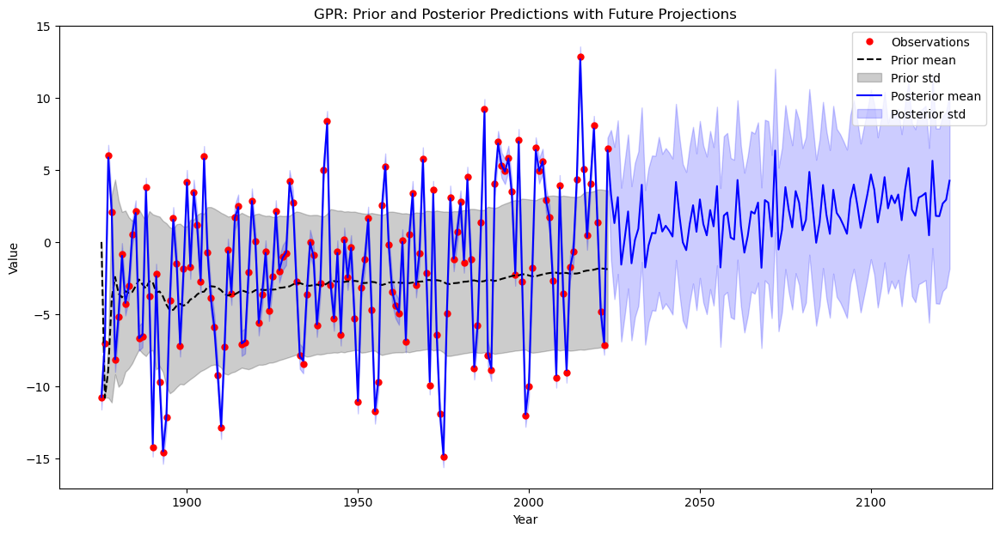

Log Marginal Likelihood:  -448.97198484474995


In [139]:
from bayes_opt import BayesianOptimization
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, ConstantKernel as C, ExpSineSquared, WhiteKernel, RationalQuadratic, RBF
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

def gp_target(c1, c2, c3, c4, c5, ls1, per1, ls2, per2, ls3, per3, noise, dp_sigma_0, rq_alpha1, rq_ls1, rq_alpha2, rq_ls2, rq_alpha3, rq_ls3, rbf_c, rbf_ls):
    kernel = (
        C(c1) * (DotProduct(sigma_0=dp_sigma_0) ** 2) +
        C(c2) * RationalQuadratic(length_scale=rq_ls1, alpha=rq_alpha1) * ExpSineSquared(length_scale=ls1, periodicity=per1) +
        C(c3) * ExpSineSquared(length_scale=ls2, periodicity=per2) * RationalQuadratic(length_scale=rq_ls2, alpha=rq_alpha2) +
        C(c4) * ExpSineSquared(length_scale=ls3, periodicity=per3) * RationalQuadratic(length_scale=rq_ls3, alpha=rq_alpha3) +
        C(c5) * RationalQuadratic(length_scale=rq_ls1, alpha=rq_alpha1) + C(rbf_c) * RBF(length_scale=rbf_ls) +
        WhiteKernel(noise_level=noise)
    )
    gp = GaussianProcessRegressor(kernel=kernel, alpha=0, n_restarts_optimizer=10)
    gp.fit(X, y)
    lml = gp.log_marginal_likelihood()
    return lml

pbounds = {
    'c1': (1e-1, 1e1),
    'c2': (1e-1, 1e1),
    'c3': (1e-1, 1e1),
    'c4': (1e-1, 1e1),
    'c5': (1e-1, 1e1),
    'ls1': (1e-2, 1e1),
    'per1': (2.0, 4.0),
    'ls2': (1e-2, 1e1),
    'per2': (4.0, 8.0),
    'ls3': (1e-2, 1e1),
    'per3': (9.0, 12.0),
    'noise': (1e-3, 1e1),
    'dp_sigma_0': (1e-3, 1e1),
    'rq_alpha1': (1e-2, 1e2),
    'rq_ls1': (1e-2, 1e1),
    'rq_alpha2': (1e-2, 1e2),
    'rq_ls2': (1e-2, 1e1),
    'rq_alpha3': (1e-2, 1e2),
    'rq_ls3': (1e-2, 1e1),
    'rbf_c': (1e-1, 1e1),
    'rbf_ls': (1e-2, 1e1),
}

optimizer = BayesianOptimization(
    f=gp_target,
    pbounds=pbounds,
    random_state=42
)

init_points = 10
n_iter = 20

with tqdm(total=init_points + n_iter, desc="Optimization Progress") as pbar:
    optimizer.maximize(init_points=init_points, n_iter=n_iter)
    pbar.update(init_points + n_iter)

best_params = optimizer.max['params']
print("Best parameters found: ", best_params)

kernel = (
    C(best_params['c1']) * (DotProduct(sigma_0=best_params['dp_sigma_0']) ** 2) +
    C(best_params['c2']) * RationalQuadratic(length_scale=best_params['rq_ls1'], alpha=best_params['rq_alpha1']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RationalQuadratic(length_scale=best_params['rq_ls2'], alpha=best_params['rq_alpha2']) +
    C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RationalQuadratic(length_scale=best_params['rq_ls3'], alpha=best_params['rq_alpha3']) +
    C(best_params['c5']) * RationalQuadratic(length_scale=best_params['rq_ls1'], alpha=best_params['rq_alpha1']) + C(best_params['rbf_c']) * RBF(length_scale=best_params['rbf_ls']) +
    WhiteKernel(noise_level=best_params['noise'])
)

gp = GaussianProcessRegressor(kernel=kernel, alpha=0, n_restarts_optimizer=10)
gp.fit(X, y)

mean_list = []
std_list = []

for i in range(len(y)):
    if i == 0:
        mean_list.append(0)
        std_list.append(0)
    else:
        mean_list.append(y[:i].mean())
        std_list.append(y[:i].std())

mean_array = np.array(mean_list)
std_array = np.array(std_list)

X_extended = np.linspace(X.min(), X.max() + 100, len(X) + 100).reshape(-1, 1)

y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)

plt.figure(figsize=(14, 7))

plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X, mean_array, 'k--', label='Prior mean')
plt.fill_between(X.ravel(), mean_array - std_array, mean_array + std_array, alpha=0.2, color='k', label='Prior std')
plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')
plt.title('GPR: Prior and Posterior Predictions with Future Projections')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()

lml = gp.log_marginal_likelihood()
print("Log Marginal Likelihood: ", lml)

### evaluation

In [142]:
def evaluate_model(gp, X, y):
    """Evaluate the Gaussian Process model using various metrics including CRPS."""
    y_pred, y_std = gp.predict(X, return_std=True)
    
    mse = mean_squared_error(y, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R² (R-squared): {r2}")
    
    return mse, rmse, mae, r2

mse, rmse, mae, r2 = evaluate_model(gp, X, y)


Mean Squared Error (MSE): 0.009874424924900616
Root Mean Squared Error (RMSE): 0.0993701410127842
Mean Absolute Error (MAE): 0.07972881837100053
R² (R-squared): 0.999671837238623


In [143]:
best_params

{'c1': 3.1722616152730687,
 'c2': 6.493663562179368,
 'c3': 2.908365502048508,
 'c4': 3.9736253182007326,
 'c5': 3.2685756033517572,
 'dp_sigma_0': 7.46296068458785,
 'ls1': 1.1524573481076557,
 'ls2': 2.581085367818879,
 'ls3': 8.175985094669675,
 'noise': 3.393286649647549,
 'per1': 3.886637361881473,
 'per2': 7.539954429173818,
 'per3': 9.67672047172686,
 'rbf_c': 8.761955330535823,
 'rbf_ls': 4.863981287799867,
 'rq_alpha1': 82.74024383508461,
 'rq_alpha2': 27.94511699480263,
 'rq_alpha3': 69.05415462186366,
 'rq_ls1': 6.8486031974343895,
 'rq_ls2': 9.085032180163555,
 'rq_ls3': 8.472099886402905}

In [145]:
gp

GaussianProcessRegressor(alpha=0,
                         kernel=1.78**2 * DotProduct(sigma_0=7.46) ** 2 + 2.55**2 * RationalQuadratic(alpha=82.7, length_scale=6.85) * ExpSineSquared(length_scale=1.15, periodicity=3.89) + 1.71**2 * ExpSineSquared(length_scale=2.58, periodicity=7.54) * RationalQuadratic(alpha=27.9, length_scale=9.09) + 1.99**2 * ExpSineSquared(length_scale=8.18, periodicity=9.68) * RationalQuadratic(alpha=69.1, length_scale=8.47) + 1.81**2 * RationalQuadratic(alpha=82.7, length_scale=6.85) + 2.96**2 * RBF(length_scale=4.86) + WhiteKernel(noise_level=3.39),
                         n_restarts_optimizer=10)

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c1     |    c2     |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |
-------------------------------------------------------------------------------------------------------------------------------------


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(

| 1         | -455.6    | 3.808     | 9.512     | 7.323     | 5.991     | 1.569     | 1.561     | 2.116     | 7.465     | 10.8      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 2         | -471.9    | 7.11      | 0.3038    | 9.699     | 8.326     | 2.131     | 1.819     | 2.367     | 5.217     | 10.57     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.w

| 3         | -471.9    | 4.376     | 2.983     | 6.122     | 1.404     | 2.929     | 3.664     | 2.912     | 7.141     | 9.599     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 4         | -471.9    | 5.191     | 5.965     | 0.474     | 6.079     | 1.714     | 0.6515    | 3.898     | 7.863     | 11.43     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnin

| 5         | -455.6    | 3.116     | 1.067     | 6.845     | 4.407     | 1.229     | 4.952     | 2.069     | 7.637     | 9.776     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 6         | -455.6    | 6.659     | 3.186     | 5.205     | 5.472     | 1.857     | 9.696     | 3.55      | 7.758     | 11.68     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(

| 7         | -470.9    | 6.019     | 9.227     | 0.894     | 1.968     | 0.4618    | 3.254     | 2.777     | 5.085     | 11.49     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 8         | -454.0    | 3.632     | 2.881     | 5.432     | 1.418     | 8.024     | 0.7464    | 3.974     | 7.089     | 9.596     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 9         | -471.9    | 0.1547    | 8.173     | 7.072     | 7.293     | 7.715     | 0.7414    | 2.717     | 4.463     | 11.59     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 10        | -472.0    | 6.271     | 3.376     | 0.6449    | 3.117     | 3.259     | 7.296     | 3.275     | 7.549     | 10.42     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 11        | -472.0    | 3.653     | 2.903     | 5.453     | 1.439     | 8.045     | 0.7677    | 3.984     | 7.11      | 9.617     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(

| 12        | -470.9    | 5.903     | 7.005     | 8.549     | 7.905     | 4.717     | 3.86      | 2.79      | 5.949     | 11.16     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 13        | -455.6    | 1.953     | 6.374     | 9.945     | 0.9425    | 8.001     | 3.682     | 3.213     | 6.496     | 9.232     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 14        | -471.9    | 6.181     | 2.916     | 8.242     | 9.2       | 8.963     | 8.192     | 3.362     | 7.705     | 10.45     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 15        | -471.5    | 0.5581    | 7.922     | 8.178     | 1.19      | 5.669     | 5.769     | 2.446     | 4.929     | 9.19      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 16        | -471.8    | 3.315     | 1.701     | 9.693     | 6.988     | 3.635     | 0.6581    | 2.196     | 7.241     | 9.453     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 17        | -481.3    | 3.136     | 7.863     | 0.05659   | 2.694     | 9.29      | 1.405     | 2.39      | 4.347     | 9.883     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 18        | -467.5    | 9.131     | 2.434     | 5.677     | 3.849     | 5.059     | 7.088     | 3.213     | 4.111     | 10.67     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


| 19        | -473.1    | 2.856     | 0.3552    | 3.378     | 4.565     | 4.811     | 6.974     | 3.567     | 7.673     | 10.68     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 20        | -455.6    | 7.691     | 8.714     | 9.527     | 9.544     | 7.925     | 1.099     | 2.031     | 7.324     | 10.12     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 21        | -468.7    | 4.807     | 0.221     | 9.469     | 1.526     | 8.426     | 8.51      | 2.042     | 4.283     | 10.36     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 22        | -473.7    | 6.087     | 8.873     | 0.795     | 5.24      | 6.395     | 2.755     | 2.202     | 5.211     | 11.25     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 23        | -471.9    | 1.127     | 3.572     | 8.337     | 7.701     | 4.784     | 6.953     | 3.084     | 7.239     | 9.398     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(

| 24        | -471.9    | 4.93      | 2.265     | 6.722     | 8.411     | 0.925     | 3.127     | 3.6       | 5.072     | 10.5      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 25        | -471.9    | 0.5616    | 5.594     | 7.499     | 4.229     | 7.82      | 7.188     | 3.083     | 7.246     | 10.64     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 26        | -455.6    | 0.8445    | 6.982     | 5.789     | 4.427     | 3.14      | 5.466     | 2.894     | 6.536     | 9.715     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k2__periodicity is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnin

| 27        | -471.9    | 9.028     | 5.66      | 8.982     | 4.145     | 9.602     | 6.505     | 2.332     | 4.161     | 11.23     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 28        | -455.6    | 5.609     | 5.229     | 1.364     | 9.125     | 1.103     | 8.035     | 3.988     | 4.56      | 11.07     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.w

| 29        | -471.2    | 2.685     | 4.423     | 9.84      | 5.206     | 6.954     | 0.5711    | 2.281     | 5.279     | 9.153     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
Optimization Progress: 100%|██████████| 30/30 [07:51<00:00, 15.72s/it]


| 30        | -465.6    | 2.184     | 4.545     | 8.947     | 6.781     | 2.793     | 4.163     | 2.719     | 7.471     | 10.59     |
Best parameters found:  {'c1': 3.631857934266534, 'c2': 2.8812516459050697, 'ls1': 5.431533870750902, 'ls2': 1.4178330074978789, 'ls3': 8.023947837732857, 'noise': 0.7464318861540284, 'per1': 3.9737738732010346, 'per2': 7.08897907718663, 'per3': 9.596147044602517}


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Log Marginal Likelihood:  -471.1683394538891
Mean Squared Error (MSE): 27.207642230833827
Root Mean Squared Error (RMSE): 5.216094538141906
Mean Absolute Error (MAE): 4.2215476182510345
R² (R-squared): 0.09579189948424593


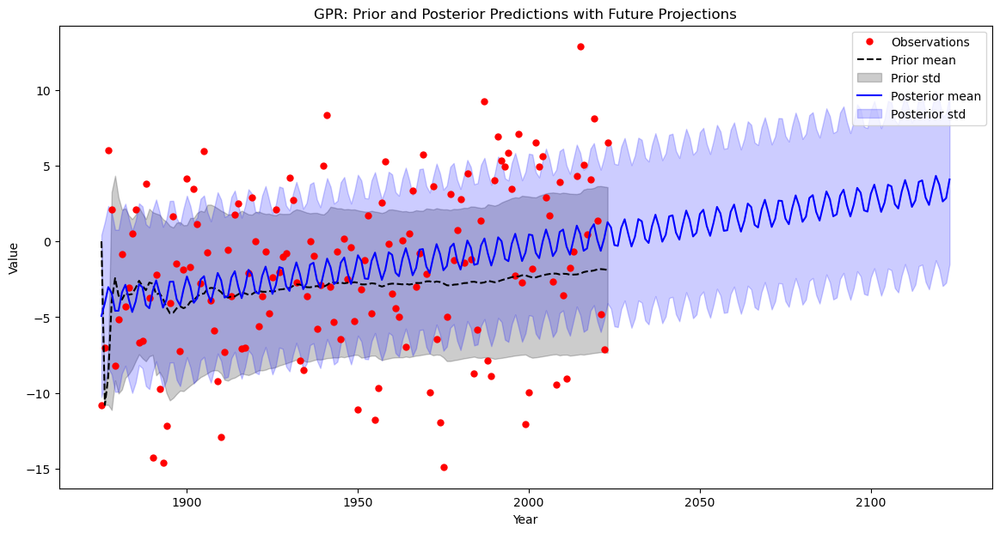

In [146]:
def gp_target(c1, c2, ls1, per1, ls2, per2, ls3, per3, noise):
    kernel = (
        C(c1) * (DotProduct() ** 2) +
        C(c2) * ExpSineSquared(length_scale=ls1, periodicity=per1) +
        C(c2) * ExpSineSquared(length_scale=ls2, periodicity=per2) +
        C(c2) * ExpSineSquared(length_scale=ls3, periodicity=per3) +
        WhiteKernel(noise_level=noise)
    )
    gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
    gp.fit(X, y)
    lml = gp.log_marginal_likelihood()
    return lml

pbounds = {
    'c1': (1e-1, 1e1),
    'c2': (1e-1, 1e1),
    'ls1': (1e-2, 1e1),
    'per1': (2.0, 4.0),
    'ls2': (1e-2, 1e1),
    'per2': (4.0, 8.0),
    'ls3': (1e-2, 1e1),
    'per3': (9.0, 12.0),
    'noise': (1e-3, 1e1),
}

optimizer = BayesianOptimization(
    f=gp_target,
    pbounds=pbounds,
    random_state=42
)

init_points = 10
n_iter = 20

with tqdm(total=init_points + n_iter, desc="Optimization Progress") as pbar:
    optimizer.maximize(init_points=init_points, n_iter=n_iter)
    pbar.update(init_points + n_iter)

best_params = optimizer.max['params']
print("Best parameters found: ", best_params)

kernel = (
    C(best_params['c1']) * (DotProduct() ** 2) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) +
    WhiteKernel(noise_level=best_params['noise'])
)

gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-1, n_restarts_optimizer=10)
gp.fit(X, y)

lml = gp.log_marginal_likelihood()
print("Log Marginal Likelihood: ", lml)

def evaluate_model(gp, X, y):
    """Evaluate the Gaussian Process model using various metrics."""
    y_pred, y_std = gp.predict(X, return_std=True)
    
    mse = mean_squared_error(y, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R² (R-squared): {r2}")
    
    return mse, rmse, mae, r2

mse, rmse, mae, r2 = evaluate_model(gp, X, y)

mean_list = []
std_list = []

for i in range(len(y)):
    if i == 0:
        mean_list.append(0)
        std_list.append(0)
    else:
        mean_list.append(y[:i].mean())
        std_list.append(y[:i].std())

mean_array = np.array(mean_list)
std_array = np.array(std_list)

X_extended = np.linspace(X.min(), X.max() + 100, len(X) + 100).reshape(-1, 1)
y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)
plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X, mean_array, 'k--', label='Prior mean')
plt.fill_between(X.ravel(), mean_array - std_array, mean_array + std_array, alpha=0.2, color='k', label='Prior std')
plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')
plt.title('GPR: Prior and Posterior Predictions with Future Projections')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()


In [152]:
kernel

2.28**2 * DotProduct(sigma_0=1) ** 2 + 2.44**2 * ExpSineSquared(length_scale=0.474, periodicity=3.9) + 2.44**2 * ExpSineSquared(length_scale=6.08, periodicity=7.86) + 2.44**2 * ExpSineSquared(length_scale=1.71, periodicity=11.4) + WhiteKernel(noise_level=0.651)

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c1     |    c2     |    c3     |    c4     |    c5     |    c6     |    ls1    |    ls2    |    ls3    |    ls4    |    ls5    |   noise   |   per1    |   per2    |   per3    |  rbf_ls   | rbf_rq_c  | rq_alpha1 | rq_alp... |  rq_ls1   | rq_ls_rbf |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 1         | -444.1    | 3.808     | 9.512     | 7.347     | 6.027     | 1.645     | 1.644     | 0.5903    | 8.663     | 6.015     | 7.084     | 0.2156    | 9.699     | 3.665     | 4.849     | 9.545     | 1.842     | 3.112     | 52.48     | 43.2      | 2.919     | 6.122     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(

| 2         | -447.4    | 1.481     | 2.992     | 3.727     | 4.615     | 7.873     | 2.077     | 5.147     | 5.928     | 0.474     | 6.079     | 1.714     | 0.6515    | 3.898     | 7.863     | 11.43     | 3.053     | 1.067     | 68.43     | 44.02     | 1.229     | 4.957     |
| 3         | -446.4    | 0.4404    | 9.102     | 2.662     | 6.659     | 3.186     | 5.249     | 5.472     | 1.857     | 9.696     | 7.754     | 9.396     | 8.948     | 3.196     | 7.687     | 9.265     | 1.968     | 0.5478    | 32.54     | 38.87     | 2.721     | 8.289     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 4         | -442.3    | 3.632     | 2.881     | 5.473     | 1.495     | 8.042     | 0.8381    | 9.869     | 7.725     | 1.995     | 0.06517   | 8.156     | 7.069     | 3.458     | 7.085     | 9.222     | 3.591     | 1.247     | 86.31     | 62.33     | 3.316     | 0.6449    |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k2__k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better v

| 5         | -447.4    | 3.179     | 3.319     | 7.323     | 6.412     | 8.883     | 4.775     | 1.205     | 7.135     | 7.61      | 5.617     | 7.712     | 4.938     | 3.045     | 5.71      | 9.076     | 1.088     | 0.4111    | 63.64     | 31.44     | 5.091     | 9.077     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 6         | -441.6    | 2.568     | 4.163     | 7.58      | 2.365     | 0.8621    | 2.969     | 1.621     | 9.298     | 8.083     | 6.338     | 8.716     | 8.037     | 2.373     | 7.57      | 10.62     | 8.076     | 8.971     | 31.81     | 11.01     | 2.287     | 4.277     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 7         | -441.7    | 8.198     | 8.621     | 0.1688    | 5.156     | 4.232     | 2.299     | 1.207     | 3.383     | 9.43      | 3.239     | 5.193     | 7.03      | 2.727     | 7.887     | 11.89     | 2.525     | 5.023     | 30.09     | 28.49     | 0.3785    | 6.1       |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 8         | -448.0    | 5.077     | 0.6096    | 2.859     | 9.092     | 2.472     | 1.534     | 4.9       | 9.857     | 2.428     | 6.725     | 7.619     | 2.377     | 3.456     | 5.471     | 10.9      | 6.339     | 5.404     | 9.038     | 83.53     | 3.215     | 1.873     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k2__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better v

| 9         | -448.4    | 0.5037    | 5.95      | 6.808     | 0.2642    | 5.17      | 2.342     | 6.455     | 1.752     | 6.912     | 3.873     | 9.368     | 1.376     | 2.682     | 4.454     | 11.77     | 8.775     | 2.654     | 66.0      | 81.72     | 5.556     | 5.301     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 10        | -444.3    | 2.494     | 1.022     | 8.982     | 9.014     | 6.368     | 3.456     | 3.499     | 7.262     | 8.972     | 8.872     | 7.801     | 6.421     | 2.168     | 4.647     | 11.7      | 6.068     | 0.1911    | 10.16     | 66.35     | 0.06057   | 1.616     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 11        | -441.2    | 2.581     | 4.176     | 7.593     | 2.378     | 0.8752    | 2.982     | 1.634     | 9.311     | 8.096     | 6.351     | 8.729     | 8.05      | 2.386     | 7.583     | 10.63     | 8.089     | 8.984     | 31.82     | 11.03     | 2.3       | 4.29      |
| 12        | -445.4    | 3.726     | 5.321     | 8.738     | 3.523     | 2.015     | 4.127     | 2.779     | 10.0      | 9.236     | 7.501     | 9.869     | 9.19      | 3.531     | 8.0       | 11.77     | 9.23      | 10.0      | 32.96     | 12.17     | 3.45      | 5.435     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 13        | -445.5    | 2.704     | 4.298     | 7.716     | 2.501     | 0.9982    | 3.104     | 1.756     | 9.57      | 8.218     | 6.474     | 8.851     | 8.172     | 2.511     | 7.894     | 10.75     | 8.211     | 9.147     | 31.94     | 11.15     | 2.423     | 4.412     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn

| 14        | -443.0    | 9.347     | 5.398     | 4.493     | 5.123     | 0.6523    | 4.02      | 9.583     | 6.9       | 5.139     | 5.02      | 5.534     | 9.916     | 3.533     | 7.137     | 9.313     | 0.5113    | 9.705     | 18.17     | 56.65     | 2.877     | 6.708     |
| 15        | -443.5    | 2.483     | 7.293     | 4.862     | 2.192     | 7.602     | 9.335     | 8.462     | 1.552     | 2.19      | 9.097     | 7.126     | 3.687     | 2.138     | 5.883     | 9.216     | 9.366     | 7.09      | 81.69     | 65.33     | 5.75      | 4.303     |
| 16        | -437.9    | 1.705     | 3.394     | 6.984     | 4.441     | 9.25      | 3.911     | 6.759     | 0.5135    | 7.307     | 3.395     | 0.4349    | 9.746     | 3.973     | 4.228     | 9.145     | 1.928     | 5.58      | 23.08     | 67.46     | 6.984     | 8.129     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 17        | -439.0    | 2.591     | 4.335     | 4.36      | 1.571     | 3.261     | 3.605     | 1.361     | 6.865     | 4.66      | 0.6381    | 6.549     | 7.088     | 2.145     | 4.874     | 11.43     | 2.578     | 5.854     | 73.1      | 80.63     | 6.121     | 4.182     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better val

| 18        | -447.4    | 1.211     | 6.401     | 1.091     | 0.6647    | 8.247     | 2.217     | 9.4       | 5.813     | 5.706     | 7.865     | 8.968     | 0.1723    | 2.429     | 5.403     | 10.96     | 7.898     | 5.422     | 18.16     | 27.35     | 7.499     | 3.358     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 19        | -447.8    | 0.9781    | 8.203     | 1.012     | 0.3767    | 9.302     | 2.401     | 2.289     | 2.068     | 6.969     | 0.8352    | 2.011     | 4.935     | 3.464     | 6.744     | 10.26     | 0.3273    | 0.9769    | 94.57     | 19.35     | 4.697     | 2.774     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 20        | -445.9    | 3.172     | 6.494     | 2.908     | 3.974     | 3.269     | 7.488     | 1.152     | 2.581     | 8.176     | 3.399     | 9.434     | 8.85      | 2.451     | 7.5       | 10.46     | 8.276     | 2.866     | 69.05     | 68.46     | 9.085     | 8.472     |
| 21        | -446.1    | 6.304     | 5.48      | 7.18      | 6.215     | 0.3867    | 9.687     | 4.0       | 2.773     | 8.922     | 2.259     | 2.805     | 3.535     | 2.366     | 5.783     | 11.63     | 1.22      | 3.697     | 0.5485    | 22.6      | 8.86      | 0.8362    |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 22        | -444.5    | 3.42      | 8.648     | 3.642     | 4.935     | 1.233     | 4.687     | 7.526     | 9.136     | 6.177     | 3.02      | 6.093     | 8.534     | 2.772     | 7.496     | 10.51     | 3.256     | 5.433     | 60.55     | 38.02     | 6.317     | 1.64      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 23        | -445.3    | 8.516     | 9.67      | 8.585     | 6.477     | 3.524     | 4.121     | 8.723     | 9.826     | 7.158     | 9.32      | 2.768     | 5.676     | 3.126     | 7.82      | 11.2      | 3.388     | 1.693     | 53.86     | 60.56     | 7.534     | 5.664     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 24        | -448.5    | 0.6896    | 3.683     | 2.64      | 9.927     | 8.1       | 2.447     | 6.994     | 4.414     | 7.902     | 3.632     | 3.371     | 2.786     | 2.025     | 7.163     | 11.89     | 8.405     | 3.521     | 77.48     | 98.73     | 2.86      | 5.917     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 25        | -447.4    | 2.341     | 7.219     | 1.558     | 6.057     | 9.142     | 6.126     | 4.296     | 7.436     | 2.986     | 5.891     | 6.217     | 5.679     | 2.54      | 6.717     | 10.03     | 0.8399    | 4.803     | 35.75     | 19.59     | 4.467     | 7.14      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 26        | -441.3    | 1.705     | 3.394     | 6.984     | 4.441     | 9.25      | 3.911     | 6.759     | 0.5135    | 7.307     | 3.395     | 0.4349    | 9.746     | 3.973     | 4.228     | 9.145     | 1.928     | 5.58      | 23.08     | 67.46     | 6.984     | 8.129     |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


| 27        | -446.6    | 4.902     | 5.348     | 6.305     | 4.209     | 9.31      | 6.425     | 4.937     | 8.267     | 7.189     | 4.807     | 4.076     | 0.3004    | 3.098     | 7.48      | 9.091     | 0.451     | 8.072     | 50.56     | 29.33     | 2.612     | 8.11      |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__k1__k1__k2__k1__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a 

| 28        | -447.4    | 1.379     | 2.396     | 2.17      | 0.4251    | 2.22      | 8.856     | 7.314     | 5.658     | 6.647     | 3.88      | 9.885     | 1.437     | 3.523     | 5.862     | 10.73     | 7.399     | 1.17      | 59.87     | 94.46     | 9.683     | 9.326     |
| 29        | -448.1    | 6.433     | 5.736     | 0.9941    | 3.495     | 6.718     | 6.856     | 5.626     | 2.499     | 4.908     | 2.897     | 1.125     | 7.931     | 2.76      | 7.17      | 11.0      | 1.908     | 9.686     | 67.39     | 6.032     | 4.019     | 0.1816    |


d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\APPsetup\anaconda\envs\rd\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
Optimization Progress: 100%|██████████| 30/30 [45:32<00:00, 91.09s/it]


| 30        | -443.7    | 2.542     | 6.356     | 8.588     | 1.527     | 2.133     | 1.854     | 6.547     | 7.904     | 7.755     | 0.09423   | 1.675     | 3.357     | 3.66      | 5.139     | 10.26     | 0.4243    | 1.737     | 65.26     | 66.54     | 6.059     | 8.857     |
Best parameters found:  {'c1': 1.7050023340067182, 'c2': 3.3937080334005443, 'c3': 6.984205480081707, 'c4': 4.440855259488338, 'c5': 9.249569626383126, 'c6': 3.9110350724826826, 'ls1': 6.758512122599825, 'ls2': 0.5134549406788588, 'ls3': 7.306636562316868, 'ls4': 3.3948026967106584, 'ls5': 0.4349002870862058, 'noise': 9.746433317141955, 'per1': 3.972558364531362, 'per2': 4.227840270855903, 'per3': 9.145001544767968, 'rbf_ls': 1.9284490783471069, 'rbf_rq_c': 5.579775122582139, 'rq_alpha1': 23.077888244337107, 'rq_alpha_rbf': 67.4550067265909, 'rq_ls1': 6.9843833887019615, 'rq_ls_rbf': 8.12864260072299}


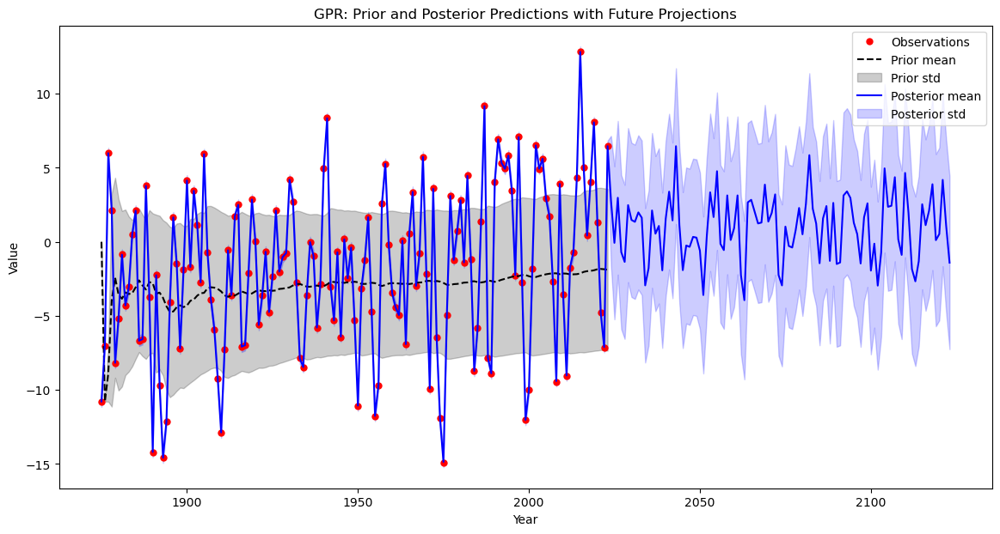

Log Marginal Likelihood:  -437.9483146187913
Mean Squared Error (MSE): 0.0003278735186069648
Root Mean Squared Error (RMSE): 0.0181072780562669
Mean Absolute Error (MAE): 0.0140539571864745
R² (R-squared): 0.9999891035802017


In [158]:
def gp_target(c1, c2, c3, c4, c5, c6, ls1, per1, ls2, per2, ls3, per3, ls4, ls5, noise, rq_alpha1, rq_ls1, rbf_rq_c, rbf_ls, rq_alpha_rbf, rq_ls_rbf):
    kernel = (
        C(c1) * RationalQuadratic(length_scale=rq_ls1, alpha=rq_alpha1) +
        C(rbf_rq_c) * RBF(length_scale=rbf_ls) * RationalQuadratic(length_scale=rq_ls_rbf, alpha=rq_alpha_rbf) +
        C(c2) * ExpSineSquared(length_scale=ls1, periodicity=per1) +
        C(c3) * ExpSineSquared(length_scale=ls2, periodicity=per2) +
        C(c4) * ExpSineSquared(length_scale=ls3, periodicity=per3) +
        C(c5) * RBF(length_scale=ls4) +
        C(c6) * RBF(length_scale=ls5) +
        WhiteKernel(noise_level=noise)
    )
    gp = GaussianProcessRegressor(kernel=kernel, alpha=0, n_restarts_optimizer=10)
    gp.fit(X, y)
    lml = gp.log_marginal_likelihood()
    return lml

pbounds = {
    'c1': (1e-1, 1e1),
    'c2': (1e-1, 1e1),
    'c3': (1e-1, 1e1),
    'c4': (1e-1, 1e1),
    'c5': (1e-1, 1e1),
    'c6': (1e-1, 1e1),
    'ls1': (1e-2, 1e1),
    'per1': (2.0, 4.0),
    'ls2': (1e-2, 1e1),
    'per2': (4.0, 8.0),
    'ls3': (1e-2, 1e1),
    'per3': (9.0, 12.0),
    'ls4': (1e-2, 1e1),
    'ls5': (1e-2, 1e1),
    'noise': (1e-3, 1e1),
    'rq_alpha1': (1e-2, 1e2),
    'rq_ls1': (1e-2, 1e1),
    'rbf_rq_c': (1e-1, 1e1),
    'rbf_ls': (1e-2, 1e1),
    'rq_alpha_rbf': (1e-2, 1e2),
    'rq_ls_rbf': (1e-2, 1e1),
}

optimizer = BayesianOptimization(
    f=gp_target,
    pbounds=pbounds,
    random_state=42
)

init_points = 10
n_iter = 20

with tqdm(total=init_points + n_iter, desc="Optimization Progress") as pbar:
    optimizer.maximize(init_points=init_points, n_iter=n_iter)
    pbar.update(init_points + n_iter)

best_params = optimizer.max['params']
print("Best parameters found: ", best_params)

kernel = (
    C(best_params['c1']) * RationalQuadratic(length_scale=best_params['rq_ls1'], alpha=best_params['rq_alpha1']) +
    C(best_params['rbf_rq_c']) * RBF(length_scale=best_params['rbf_ls']) * RationalQuadratic(length_scale=best_params['rq_ls_rbf'], alpha=best_params['rq_alpha_rbf']) +
    C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
    C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) +
    C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) +
    C(best_params['c5']) * RBF(length_scale=best_params['ls4']) +
    C(best_params['c6']) * RBF(length_scale=best_params['ls5']) +
    WhiteKernel(noise_level=best_params['noise'])
)

gp = GaussianProcessRegressor(kernel=kernel, alpha=0, n_restarts_optimizer=10)
gp.fit(X, y)

mean_list = []
std_list = []

for i in range(len(y)):
    if i == 0:
        mean_list.append(0)
        std_list.append(0)
    else:
        mean_list.append(y[:i].mean())
        std_list.append(y[:i].std())

mean_array = np.array(mean_list)
std_array = np.array(std_list)

X_extended = np.linspace(X.min(), X.max() + 100, len(X) + 100).reshape(-1, 1)
y_pred_post_extended, y_std_post_extended = gp.predict(X_extended, return_std=True)
plt.figure(figsize=(14, 7))
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(X, mean_array, 'k--', label='Prior mean')
plt.fill_between(X.ravel(), mean_array - std_array, mean_array + std_array, alpha=0.2, color='k', label='Prior std')
plt.plot(X_extended, y_pred_post_extended, 'b-', label='Posterior mean')
plt.fill_between(X_extended.ravel(), y_pred_post_extended - y_std_post_extended, y_pred_post_extended + y_std_post_extended, alpha=0.2, color='b', label='Posterior std')
plt.title('GPR: Prior and Posterior Predictions with Future Projections')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Value')
plt.show()

lml = gp.log_marginal_likelihood()
print("Log Marginal Likelihood: ", lml)
mse, rmse, mae, r2 = evaluate_model(gp, X, y)